In [1]:
from basic_Nab_analysis import *
import basicFunctions as bf
from tqdm import tqdm
import matplotlib as mpl
%matplotlib notebook
plt.rcParams['figure.figsize'] = [8, 5]

Due to some ongoing work on experimental GPU features, some warning statments may print during import
If you see statements about CUDA or cupy, they should be safe to ignore
If you have any questions feel free to email me: dgma224@g.uky.edu
cupy not available to accelerate processing
No module named 'cupy'


# Experimental data

In [9]:
figDir = "/Users/leenderthayen/git/NDP/analysis/figures/"
figPrefix = "6_29_"

fileDir = "/Users/leenderthayen/git/NDP/data/UoM/150V_proton_109Cd_6_29/"



keys = ["Cd 1", "p+", "BG", "Cd 2"]

tempFiles = ["temperature_Cd_Run1_468_1.csv",
            "temperature_proton_Run3_470_1.csv",
            "temperature_BG_Run2_469_1.csv",
            "temperature_Cd_Run4_471_1.csv"]

biasFiles = ["biascurrent_Cd_Run1_468_1.csv",
            "biascurrent_proton_Run3_470_1.csv",
            "biascurrent_BG_Run2_469_1.csv",
            "biascurrent_Cd_Run4_471_1.csv"]

scopeFiles = ["ScopeRun468_1.scope",
             "ScopeRun470_1.scope",
            "ScopeRun469_1.scope",
             "ScopeRun471_1.scope"]

filtrFiles = ["ScopeRun468_1.filtr",
             "ScopeRun470_1.filtr",
             "ScopeRun469_1.filtr",
             "ScopeRun471_1.filtr"]

#tempFiles = ["temperature_Cd109_run1_456_2.csv",
#            "temperature_proton_run2_457_1.csv",
#            "temperature_BG_run3_459_1.csv",
#            "temperature_Cd109_run4_460_1.csv"]

#biasFiles = ["biascurrent_Cd109_run1_456_2.csv",
#            "biascurrent_proton_run2_457_1.csv",
#            "biascurrent_BG_run3_459_1.csv",
#            "biascurrent_Cd109_run4_460_1.csv"]

#scopeFiles = ["ScopeRun456_2.scope",
#             "ScopeRun457_1.scope",
#             "ScopeRun459_1.scope",
#             "ScopeRun460_3.scope"]

#filtrFiles = ["ScopeRun456_2.filtr",
#             "ScopeRun457_1.filtr",
#             "ScopeRun459_1.filtr",
#             "ScopeRun460_3.filtr"]

#tempFiles = ["temperatureCd109run1__444_0.csv",
#            "temperatureprotonrun3__447_1.csv",
#            "temperatureBGrun4__449_1.csv",
#            "temperatureCd109run5__451__2.csv"]

#biasFiles = ["biascurrentCd109run1__444_0.csv",
#            "biascurrentprotonrun3__447_1.csv",
#            "biascurrentBGrun4__449_1.csv",
#            "biascurrentCd109run5__451__2.csv"]

#scopeFiles = ["ScopeRun444_0.scope",
#             "ScopeRun447_1-002.scope",
#             "ScopeRun449_1.scope",
#             "ScopeRun451_2.scope"]

mappingFile = "../BoardChannelToPixelMap_Manitoba_6_23_2021_sorted.csv"

#tempFiles = ["Run-420_0  Cd109_Vb=-50V/temperature_420_0.csv", 
#             "Run-416_1 Cd109_Vb=-75V/temperature_416_1.csv", 
#             "Run-417_0 Cd109_Vb=-90V/temperature_417_0.csv",
#             "Run-418_0  Cd109_Vb=-120V/temperature_418_0.csv",
#             "Run-419_0  Cd109_Vb=-150V/temperature_419_0.csv"]

#biasFiles = ["Run-420_0  Cd109_Vb=-50V/biascurrent_420_0.csv", 
#             "Run-416_1 Cd109_Vb=-75V/biascurrent_416_1.xlsx", 
#             "Run-417_0 Cd109_Vb=-90V/biascurrent_417_0.csv",
#             "Run-418_0  Cd109_Vb=-120V/biascurrent_418_0.csv",
#             "Run-419_0  Cd109_Vb=-150V/biascurrent_419_0.csv"]

#scopeFiles = ["Run-420_0  Cd109_Vb=-50V/ScopeRun420_0-004.scope", 
#              "Run-416_1 Cd109_Vb=-75V/ScopeRun416_1-002.scope", 
#              "Run-417_0 Cd109_Vb=-90V/ScopeRun417_0-003.scope", 
#              "Run-418_0  Cd109_Vb=-120V/ScopeRun418_0-006.scope", 
#              "Run-419_0  Cd109_Vb=-150V/ScopeRun419_0-005.scope"]
#mappingFile = "PixelFetPreampMapManitoba6-16-2021.csv"

## Temperature & Bias current

In [10]:
tempDict = dict()
biasDict = dict()
for i in range(len(tempFiles)):
    tempDict[keys[i]] = loadTemperatureData(fileDir + tempFiles[i])
    biasDict[keys[i]] = loadBiasCurrentData(fileDir + biasFiles[i])

In [11]:
tempDict[keys[0]].info()
biasDict[keys[0]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4489 entries, 0 to 4488
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Detector        4489 non-null   float64       
 1   FET S           4489 non-null   float64       
 2   FET N           4489 non-null   float64       
 3   Ring            4489 non-null   float64       
 4   Preamp          4489 non-null   float64       
 5   Abs time        4489 non-null   float64       
 6   Time stamp 12h  4489 non-null   datetime64[ns]
 7   Date            4489 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(6)
memory usage: 280.7 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4496 entries, 0 to 4495
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Bias status       4496 non-null   int64         
 1   Nominal bias      4496 non-null   float6

<IPython.core.display.Javascript object>


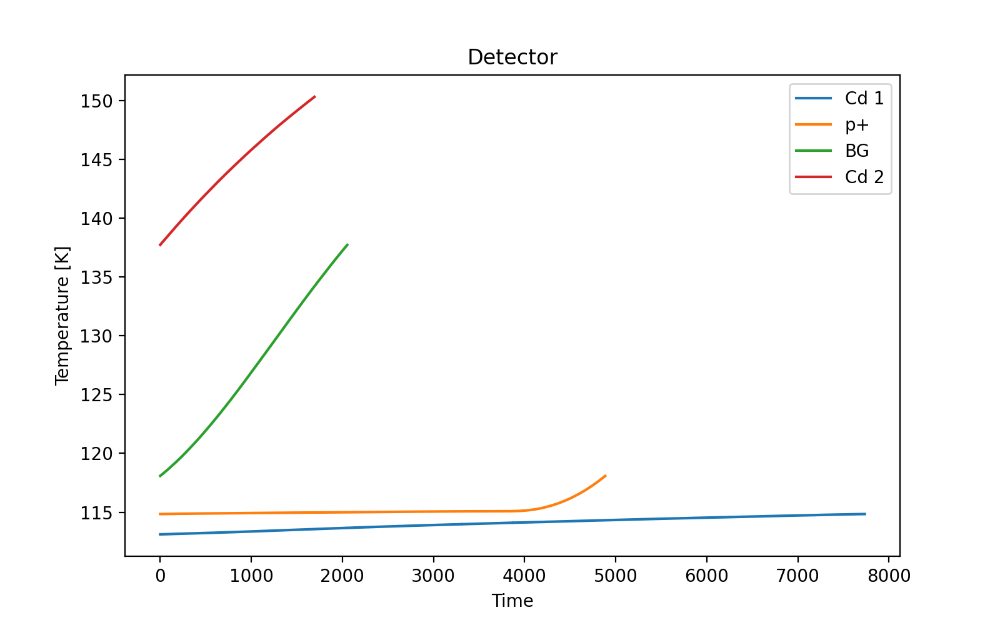

<IPython.core.display.Javascript object>


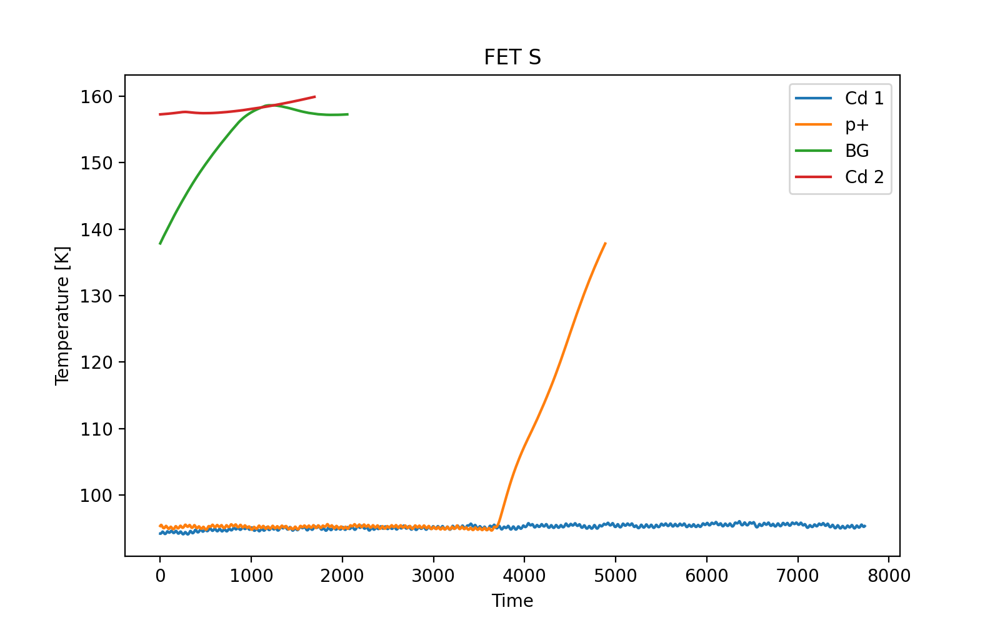

<IPython.core.display.Javascript object>


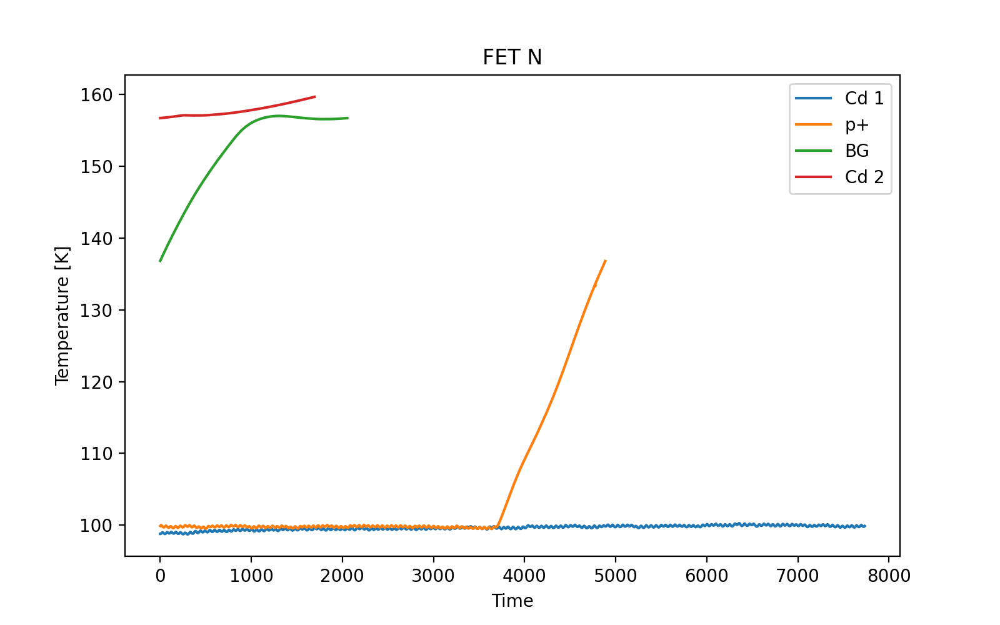

<IPython.core.display.Javascript object>


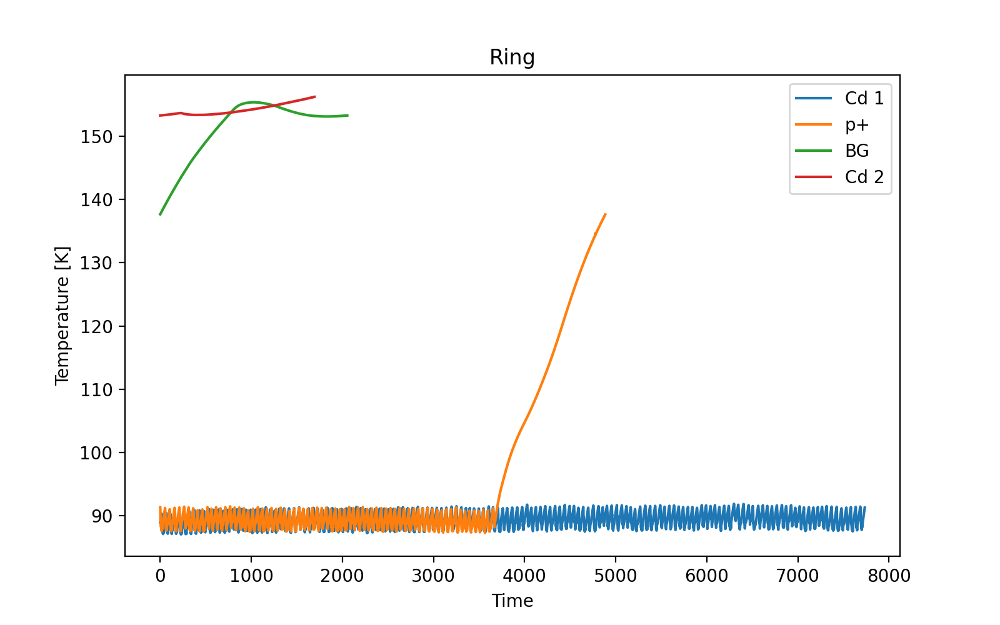

<IPython.core.display.Javascript object>


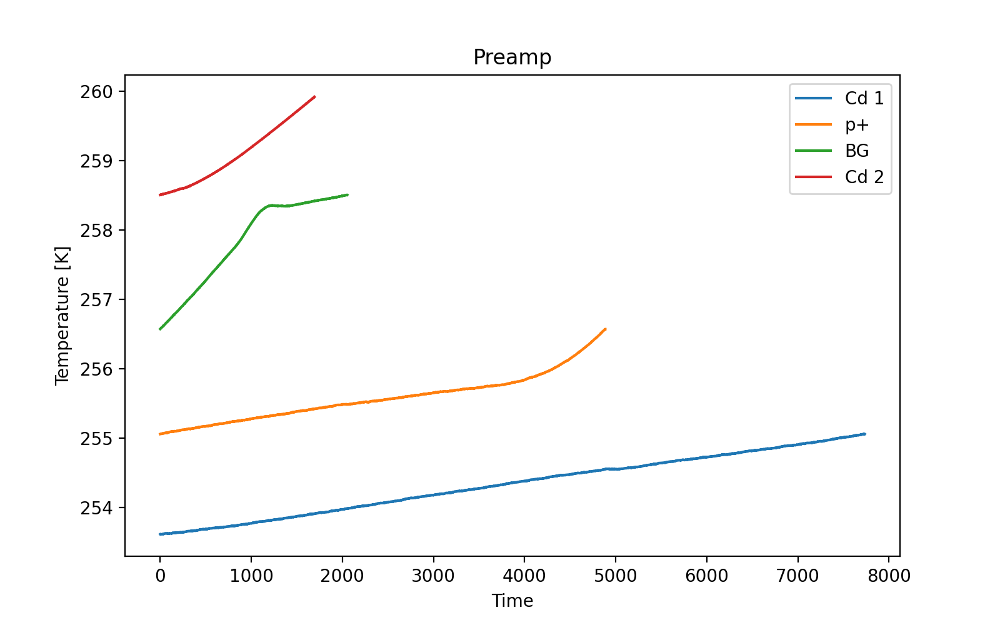

<IPython.core.display.Javascript object>


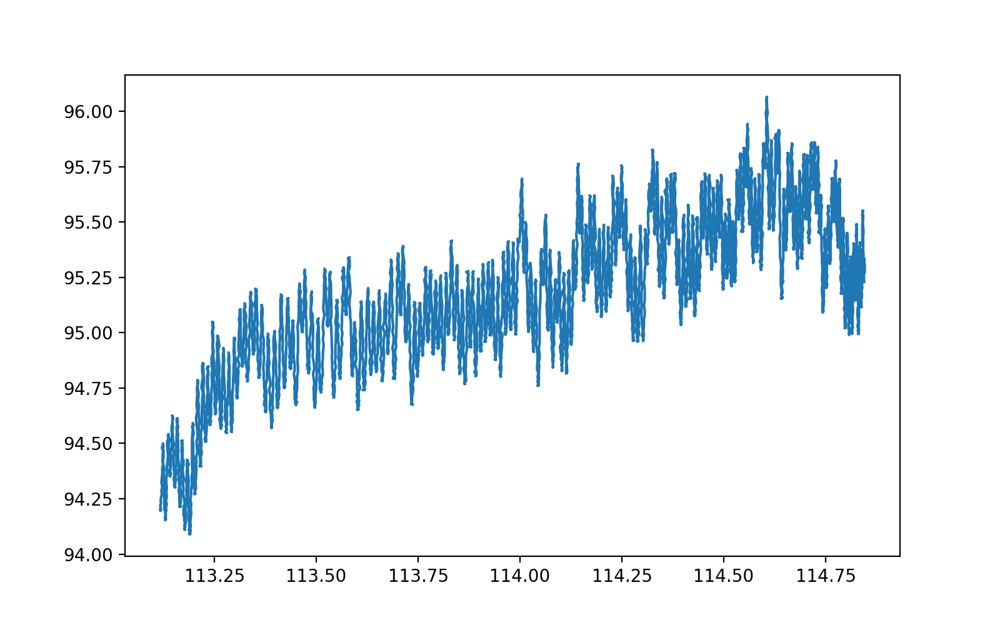

<IPython.core.display.Javascript object>


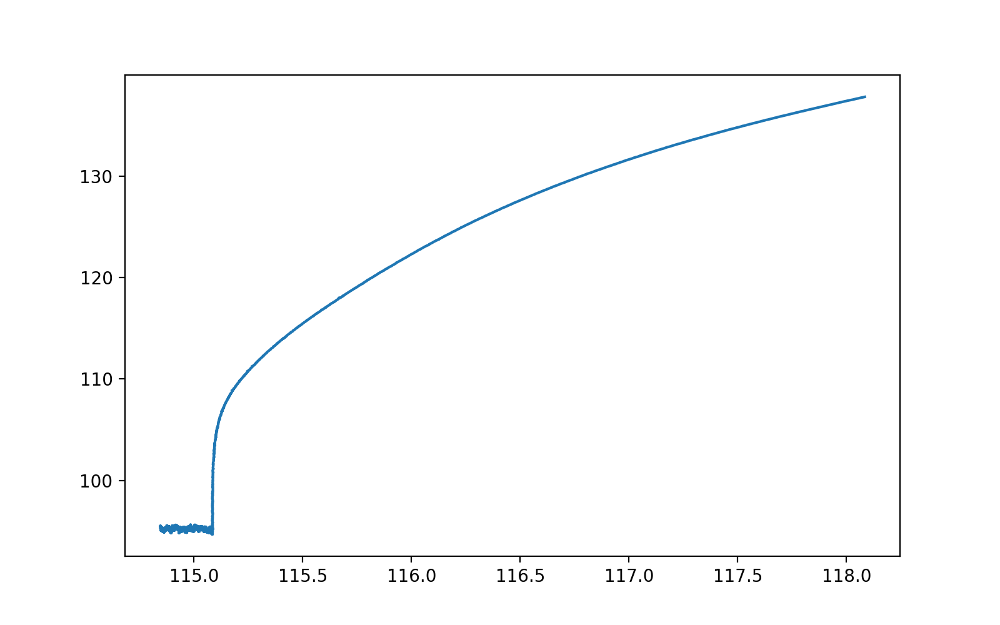

<IPython.core.display.Javascript object>


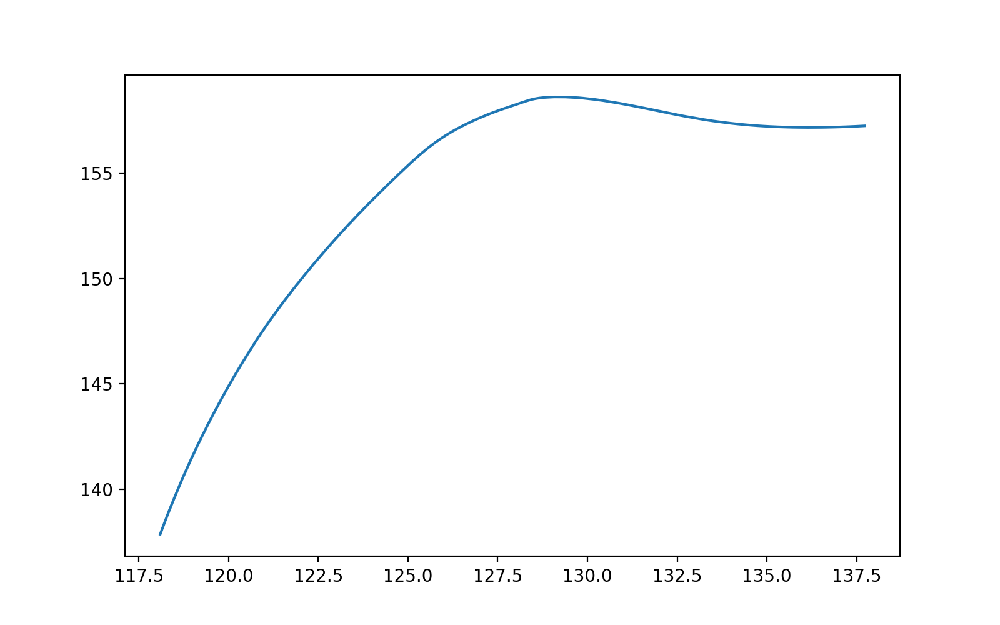

<IPython.core.display.Javascript object>


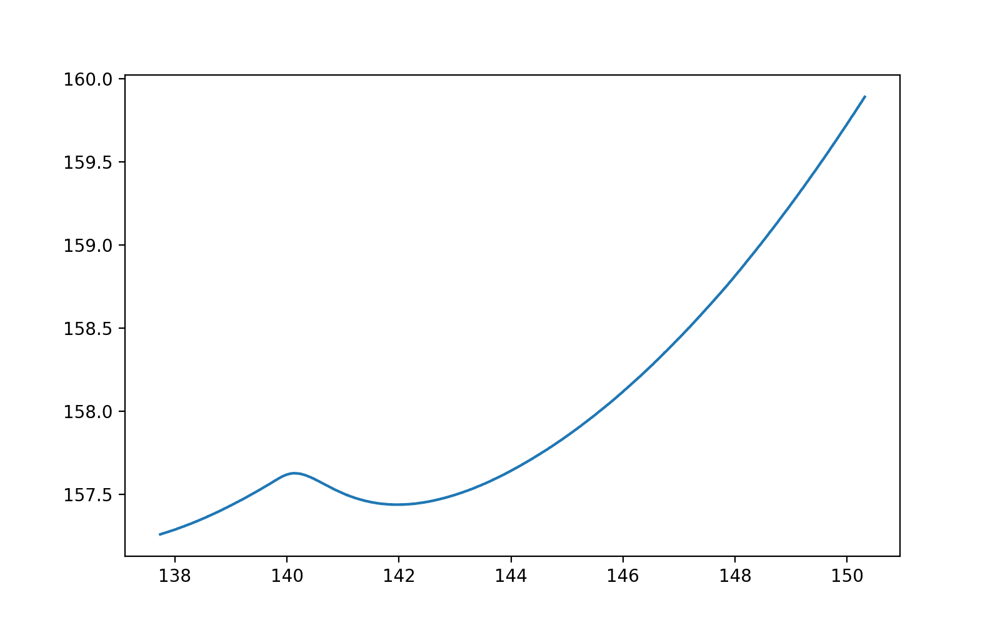

In [159]:
for i in range(5):
    plt.figure()
    n = tempDict[keys[0]].columns[i]
    for k in keys:
        plt.plot(tempDict[k][n]+273, label=k)
    plt.xlabel("Time")
    plt.ylabel("Temperature [K]")
    plt.title(n)
    plt.legend(loc=0)
    plt.savefig(figDir + "%stemperature_%s" % (figPrefix, n))

for i in range(len(keys)):
    plt.figure()
    plt.plot(tempDict[keys[i]]["Detector"]+273, tempDict[keys[i]]["FET S"]+273)

<IPython.core.display.Javascript object>


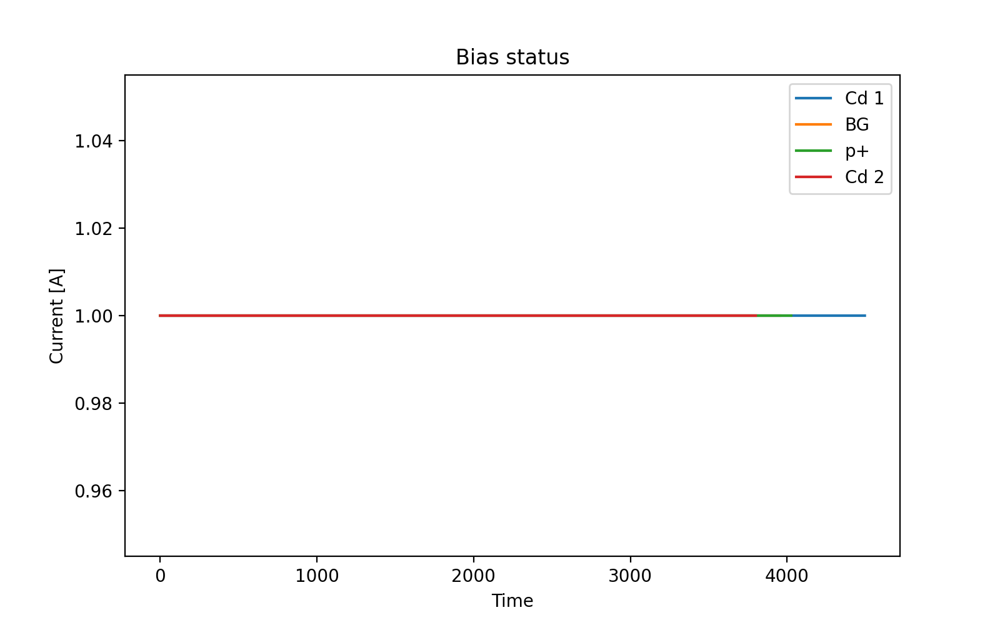

<IPython.core.display.Javascript object>


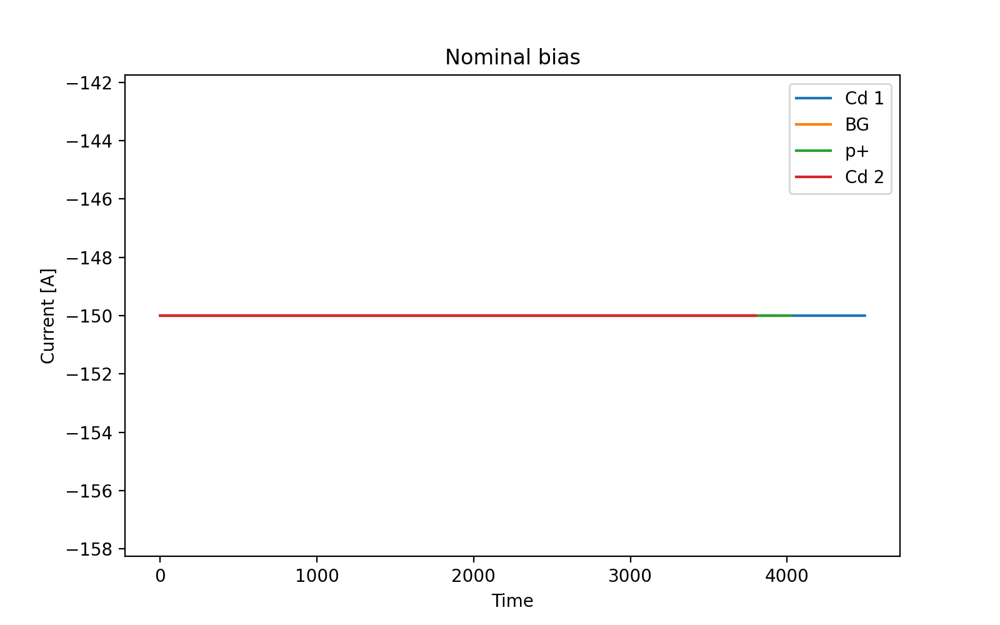

<IPython.core.display.Javascript object>


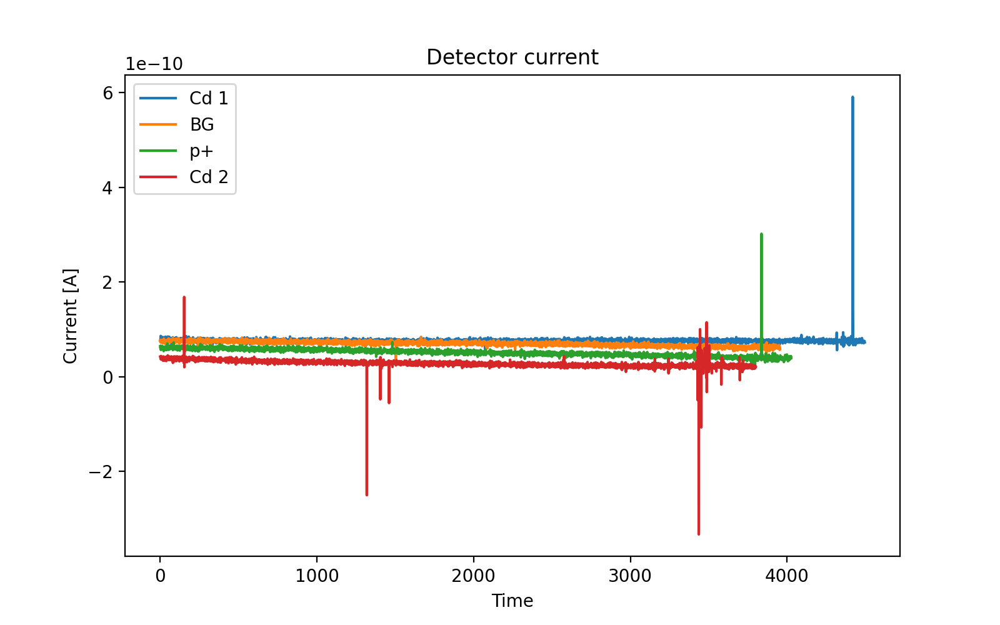

In [110]:
for i in range(3):
    plt.figure()
    n = biasDict[keys[0]].columns[i]
    for k in keys:
        plt.plot(biasDict[k][n], label=k)
    plt.xlabel("Time")
    plt.ylabel("Current [A]")
    plt.title(n)
    plt.legend(loc=0)
    plt.savefig(figDir + "%sbias_%s" % (figPrefix,n))

<IPython.core.display.Javascript object>


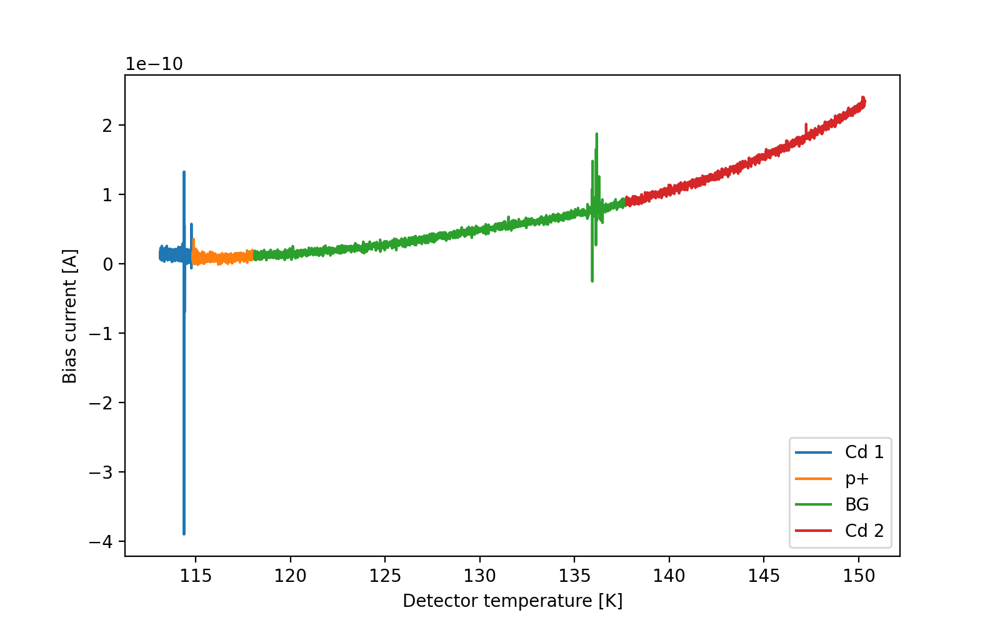

In [161]:
plt.figure()
for i in range(len(keys)):
    t = tempDict[keys[i]]["Detector"]+273
    b = biasDict[keys[i]]["Detector current"]
    index = min(len(t), len(b))
    plt.plot(t[:index], b[:index], label=keys[i])
plt.legend(loc=0)
plt.xlabel("Detector temperature [K]")
plt.ylabel("Bias current [A]")
plt.savefig(figDir + figPrefix + "bias_current_vs_temp")

## Pixel mapping

In [5]:
#pixelMappingDF = pd.read_csv(fileDir + mappingFile, na_values=[""])
#pixelMappingDF.fillna(-1, axis=1, inplace=True)
#pixelMappingDF.info()
#pixelMappingDF["bc"] = 8*pixelMappingDF["Board"] + pixelMappingDF["Channel"]
#pixelMappingDF.sort_values("Pixel Number", inplace=True)
#pixelMappingDF.head(10)

#pixelMapping = np.zeros(127, dtype=[('bc', np.int32), ('pixel', np.int32)])
#for index, row in pixelMappingDF.iterrows():
#    if row['Pixel Number'] != -1:
#        pixelMapping[int(row['Pixel Number'])-1] = row['bc'], row['Pixel Number']
#print(pixelMapping)

pixelMapping = np.genfromtxt(fileDir + mappingFile, delimiter=",", dtype=[('bc', np.int32), ('pixel', np.int32)], skip_header=1)
print(pixelMapping)

[( 67,   1) ( 75,   2) ( 73,   3) ( 74,   4) ( 80,   5) ( 78,   6)
 ( 88,   7) ( 69,   8) ( 68,   9) ( 79,  10) ( 72,  11) ( 82,  12)
 ( 86,  13) ( 90,  14) ( 92,  15) ( 61,  16) ( 66,  17) ( 65,  18)
 ( 70,  19) ( 71,  20) ( 77,  21) ( 97,  22) ( 95,  23) ( -1,  24)
 ( 57,  25) ( 58,  26) ( 64,  27) ( 59,  28) ( 87,  29) ( 85,  30)
 ( 83,  31) ( 89,  32) ( -1,  33) ( 94,  34) ( 53,  35) ( 63,  36)
 ( 62,  37) ( 52,  38) ( 76,  39) ( 81,  40) ( 91,  41) ( 98,  42)
 ( -1,  43) ( 93,  44) ( -1,  45) ( 49,  46) ( 55,  47) ( 48,  48)
 ( 51,  49) ( 56,  50) ( 60,  51) ( 84,  52) ( 96,  53) ( -1,  54)
 ( -1,  55) ( -1,  56) ( -1,  57) ( 50,  58) ( 54,  59) ( 46,  60)
 ( 41,  61) ( 44,  62) ( 47,  63) ( 43,  64) ( -1,  65) ( 99,  66)
 ( -1,  67) (103,  68) ( -1,  69) ( -1,  70) ( 38,  71) ( 42,  72)
 ( 45,  73) ( 34,  74) ( 32,  75) ( 17,  76) (105,  77) (106,  78)
 (100,  79) ( -1,  80) ( -1,  81) (101,  82) ( 39,  83) ( 35,  84)
 ( 37,  85) ( 36,  86) ( 27,  87) ( 20,  88) (  6,  89) (  0, 

## Trap filter analysis

In [12]:
scopeDict = dict()
cuts = []
for i in range(len(scopeFiles)):
    scopeDict[keys[i]] = analyseWFFiles(fileDir + scopeFiles[i], cuts)

INFO:root:Entering analyseWFFiles for file(s):/Users/leenderthayen/git/NDP/data/UoM/150V_proton_109Cd_6_29/ScopeRun468_1.scope
  0%|          | 0/5 [00:00<?, ?it/s]

[[17, 18, 19, 20, 21, 22], array([5, 2, 5, ..., 0, 2, 3]), array([25053,  7512, 13620, 17651, 11330,  6509])]


100%|██████████| 5/5 [00:57<00:00, 11.41s/it]
INFO:root:Energy timing done
INFO:root:Entering analyseWFFiles for file(s):/Users/leenderthayen/git/NDP/data/UoM/150V_proton_109Cd_6_29/ScopeRun470_1.scope
  0%|          | 0/2 [00:00<?, ?it/s]

[[17, 18, 19, 20, 21, 22], array([0, 3, 0, ..., 0, 1, 0]), array([28029,   755,  1217,  1359,   879,   735])]


100%|██████████| 2/2 [00:16<00:00,  8.34s/it]
INFO:root:Energy timing done
INFO:root:Entering analyseWFFiles for file(s):/Users/leenderthayen/git/NDP/data/UoM/150V_proton_109Cd_6_29/ScopeRun469_1.scope
  0%|          | 0/1 [00:00<?, ?it/s]

[[17, 18, 19, 20, 21, 22], array([0, 0, 0, ..., 5, 5, 0]), array([5741,  729, 1270, 1338,  883,  741])]


100%|██████████| 1/1 [00:05<00:00,  5.13s/it]
INFO:root:Energy timing done
INFO:root:Entering analyseWFFiles for file(s):/Users/leenderthayen/git/NDP/data/UoM/150V_proton_109Cd_6_29/ScopeRun471_1.scope
  0%|          | 0/4 [00:00<?, ?it/s]

[[17, 18, 19, 20, 21, 22], array([0, 2, 0, ..., 1, 0, 3]), array([21166,  6716, 12076, 15439,  9949,  5974])]


100%|██████████| 4/4 [00:37<00:00,  9.47s/it]
INFO:root:Energy timing done


In [13]:
hitsDict = dict()
for k in keys:
    wfData = scopeDict[k][0]
    hits = np.zeros(127)
    bcsHits = wfData.bcs
    i = 0
    for bc in bcsHits[0]:
        pixel = pixelMapping['pixel'][pixelMapping['bc']==bc]
        hits[pixel-1] = bcsHits[-1][i]
        i += 1
    hitsDict[k] = hits

## Hit maps

<IPython.core.display.Javascript object>


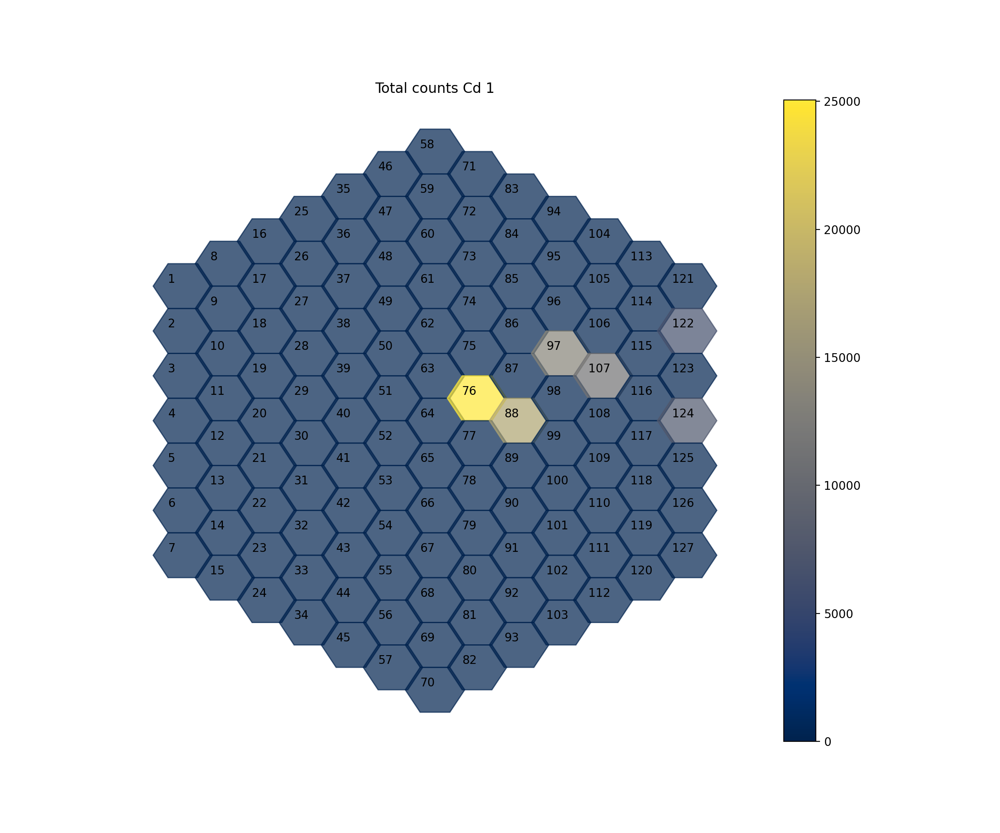

<IPython.core.display.Javascript object>


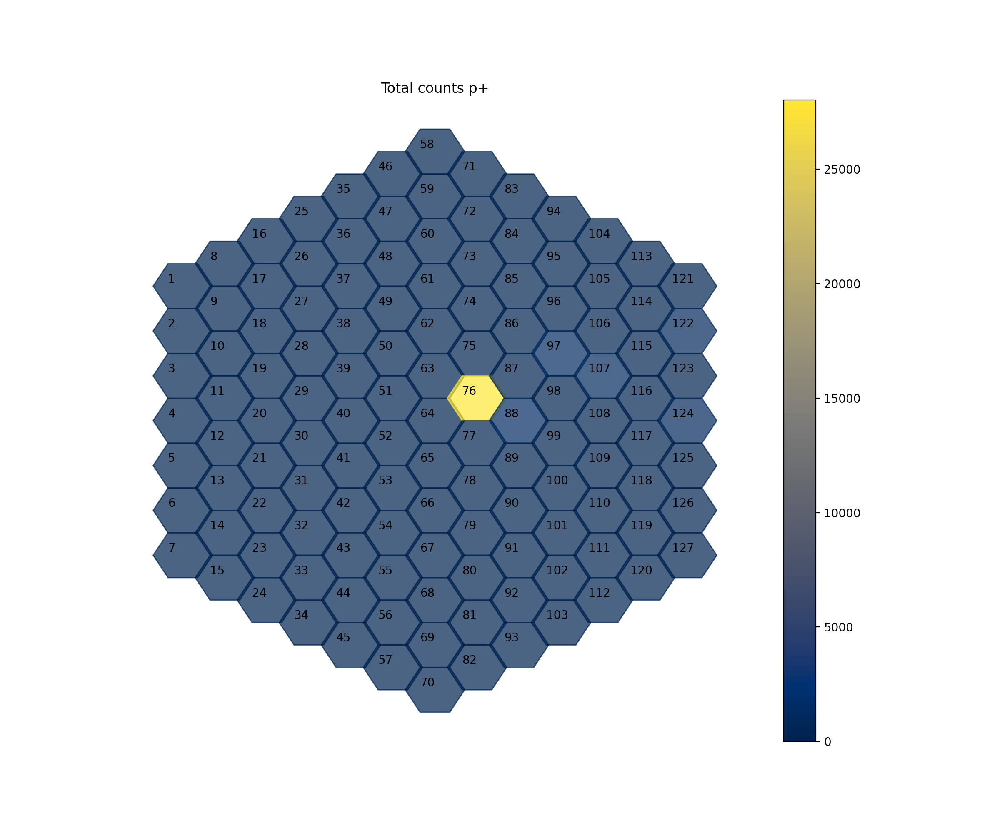

<IPython.core.display.Javascript object>


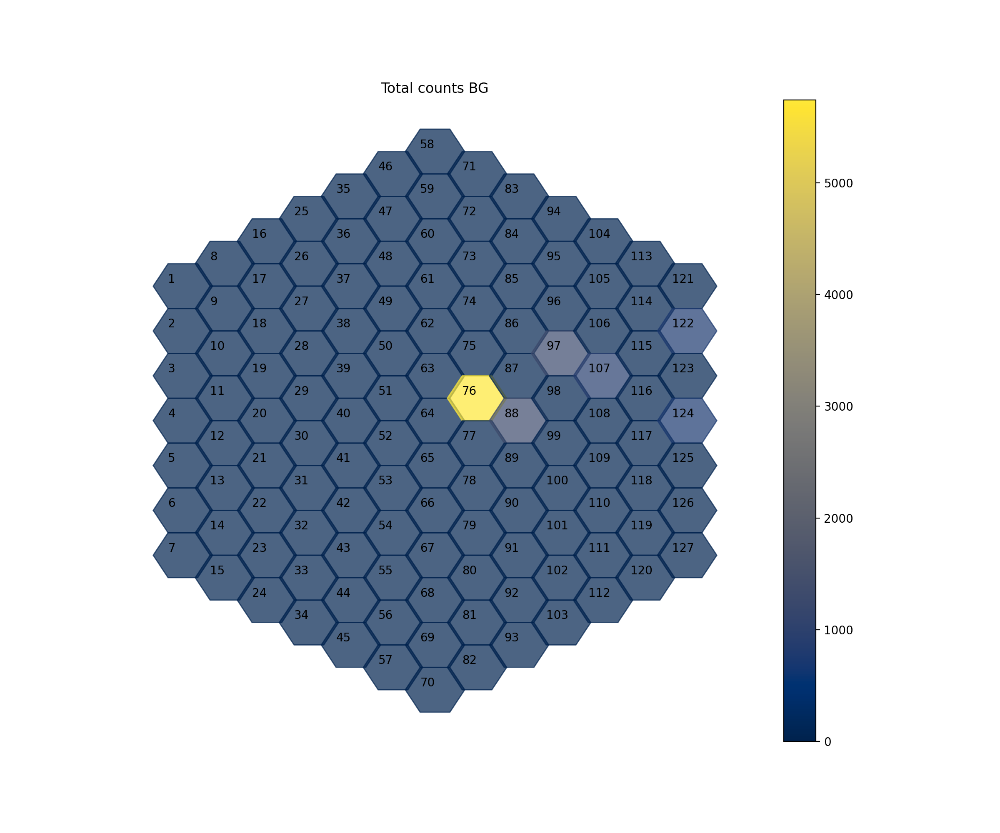

<IPython.core.display.Javascript object>


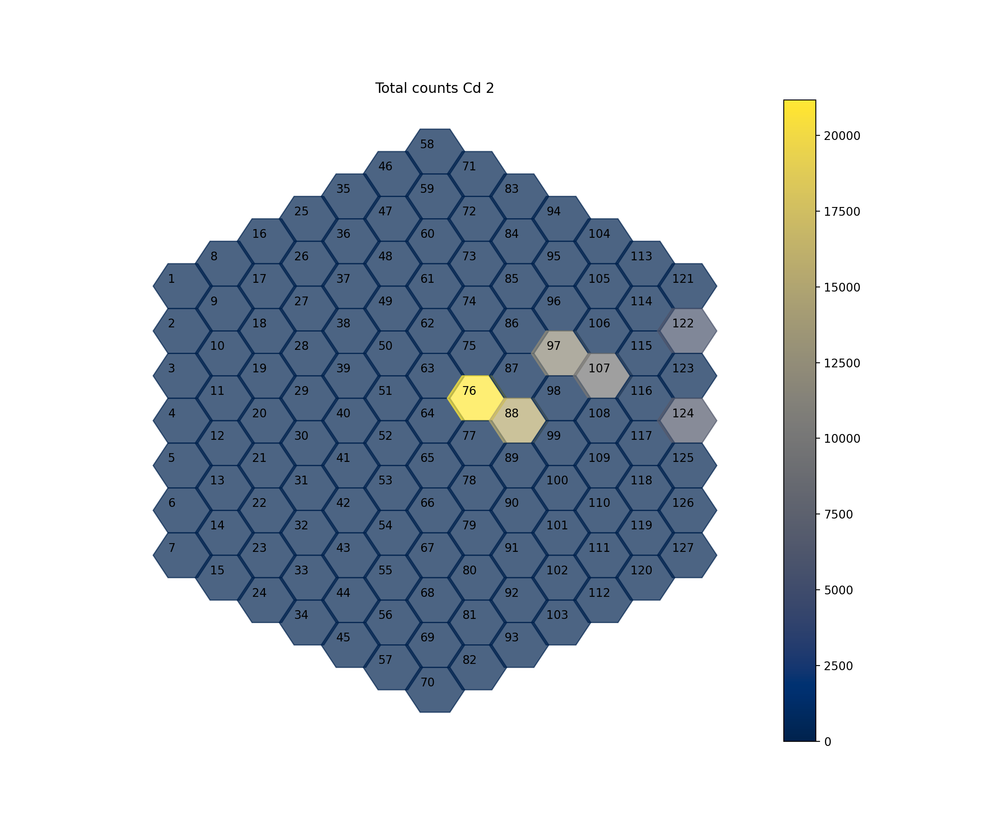

In [14]:
for k in keys:
    bf.plotOneDetector(hitsDict[k], alpha=0.7, showVal = True, title="Total counts %s" % k, filename=figDir + "%scounts_map_%s" % (figPrefix,k))

In [16]:
bcs = np.arange(17, 23)
hitsCutDict = dict()
bins = np.arange(0, 200, 0.2)
for k in keys:
    results = scopeDict[k][-1]
    hists = np.zeros((127, len(bins)-1))
    for bc in bcs:
        results.resetCuts()
        results.defineCut('bc', '=', bc)
        results.defineCut('t0', 'between', 3000, 4000)
        hist, _ = np.histogram(results.data()['energy'], bins=bins)
        pixel = pixelMapping['pixel'][pixelMapping['bc']==bc]
        hists[pixel-1, :] = hist
    hitsCutDict[k] = hists

<IPython.core.display.Javascript object>


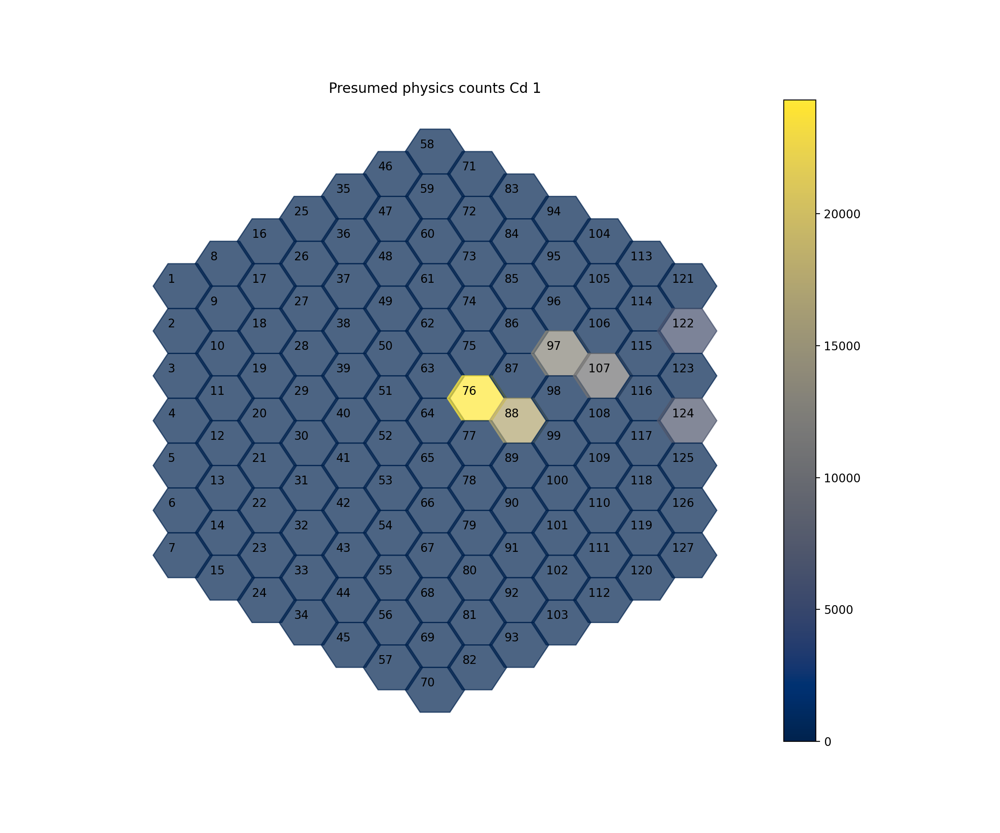

<IPython.core.display.Javascript object>


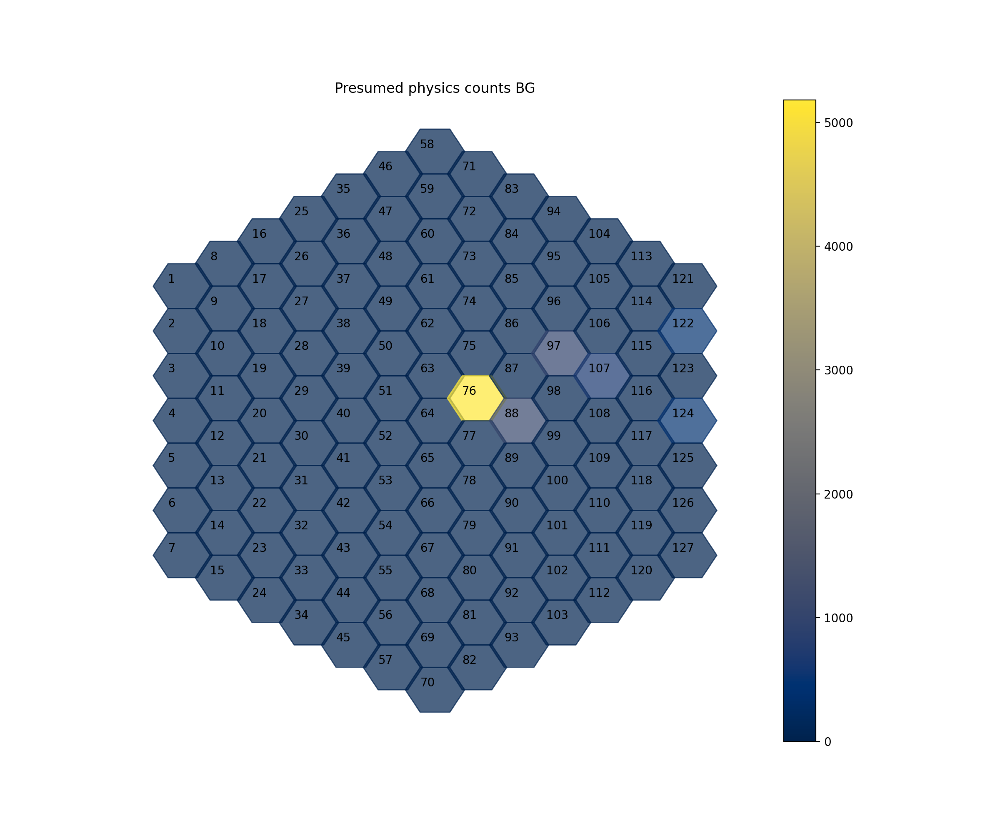

<IPython.core.display.Javascript object>


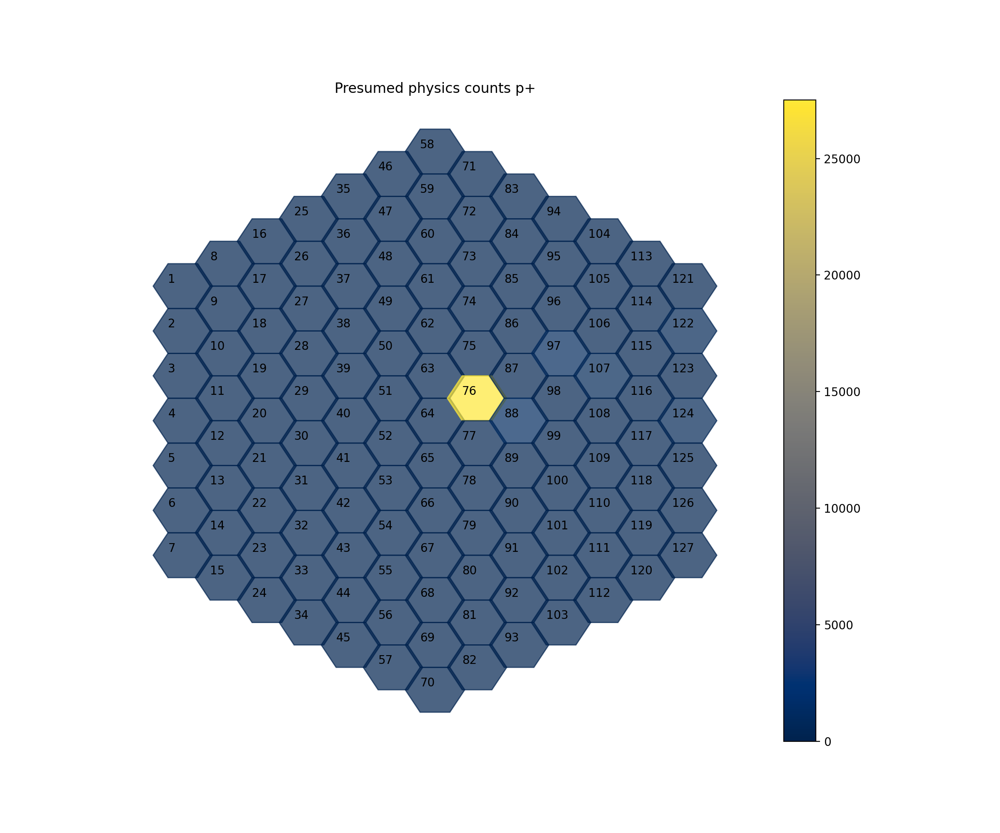

<IPython.core.display.Javascript object>


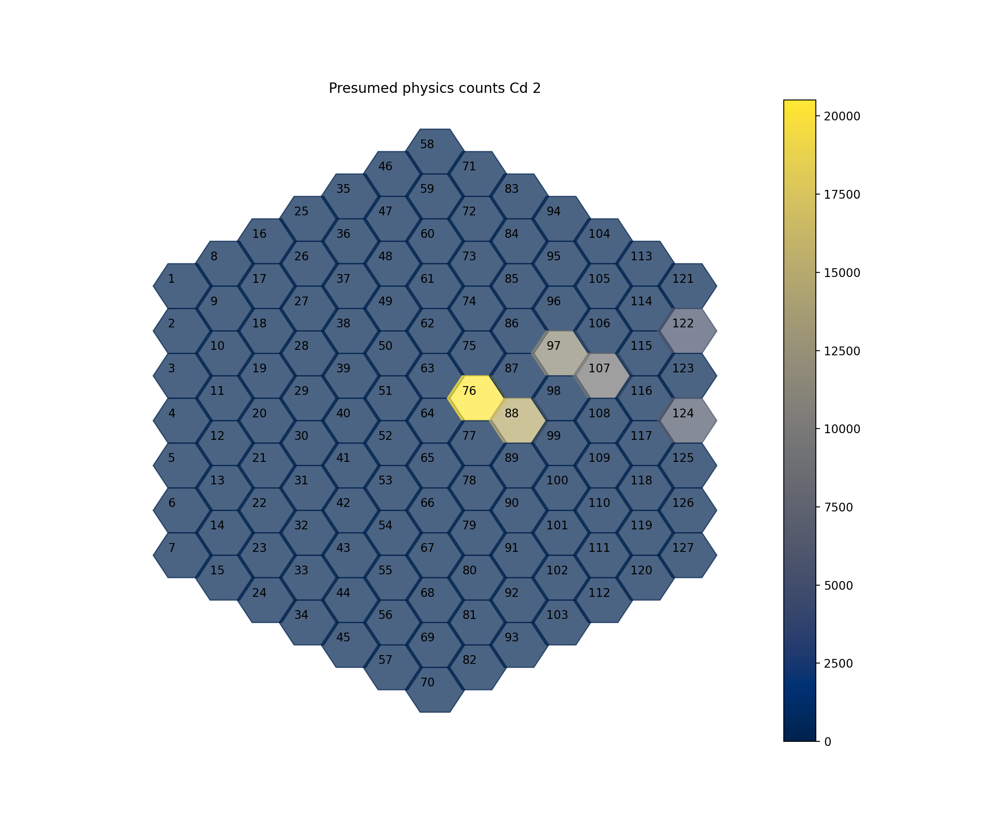

In [121]:
for k in keys:
    hitsCut = np.sum(hitsCutDict[k], axis=1)
    bf.plotOneDetector(hitsCut, alpha=0.7, showVal = True, title="Presumed physics counts %s" % k, filename=figDir + "%sphysics_count_map_%s" % (figPrefix, k))

In [ ]:
for k in keys:
    hitsCut = np.sum(hitsCutDict[k], axis=1)
    bf.plotOneDetector(hitsDict[k]-hitsCut, alpha=0.7, showVal = True, title="Noise counts %s" % k, filename=figDir + "bias_scan_noise_map_%s" % k)

## Pixel spectra

<IPython.core.display.Javascript object>


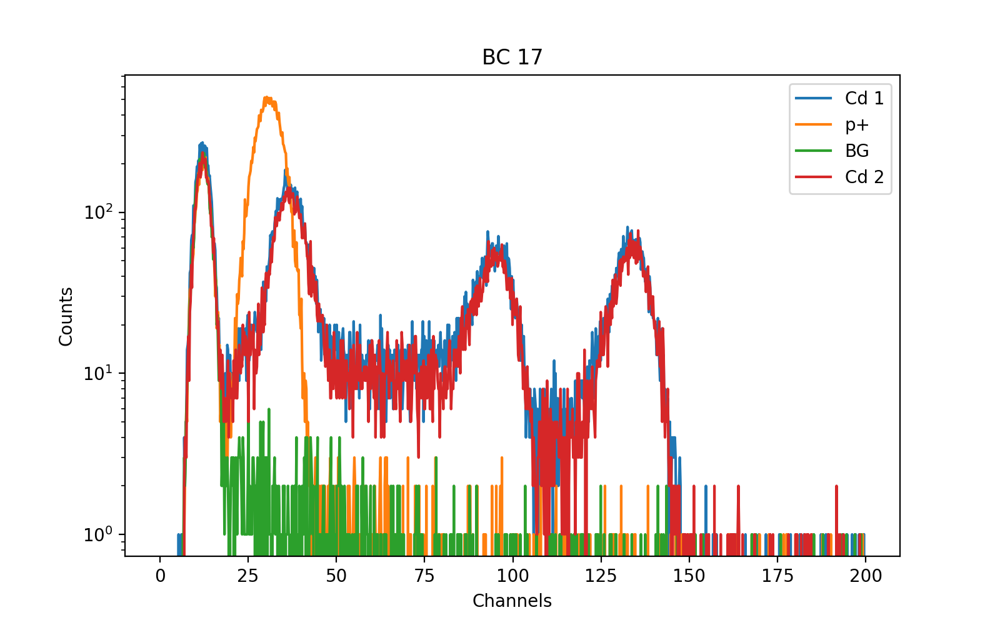

<IPython.core.display.Javascript object>


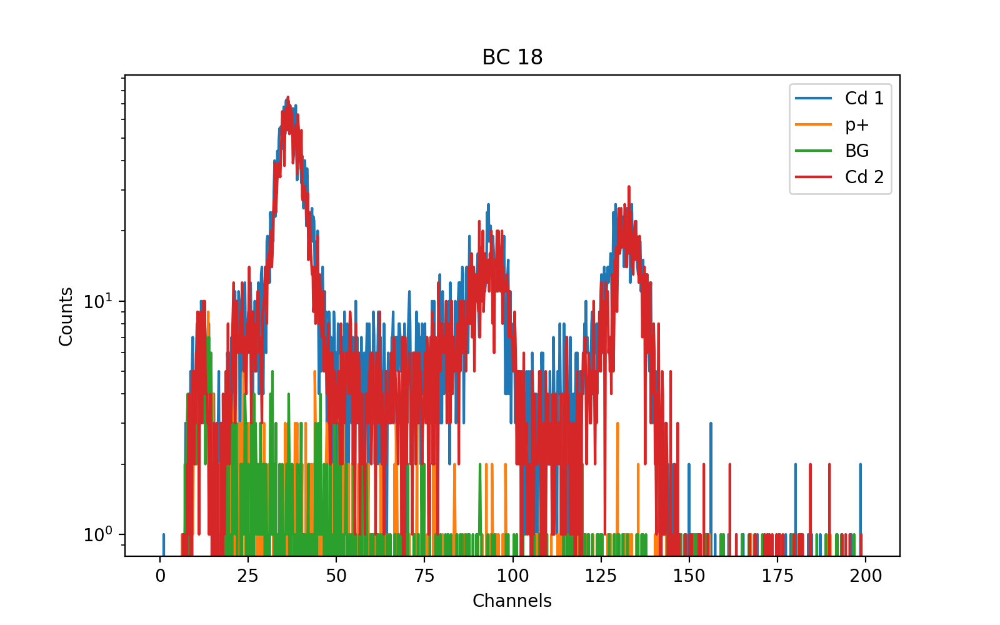

<IPython.core.display.Javascript object>


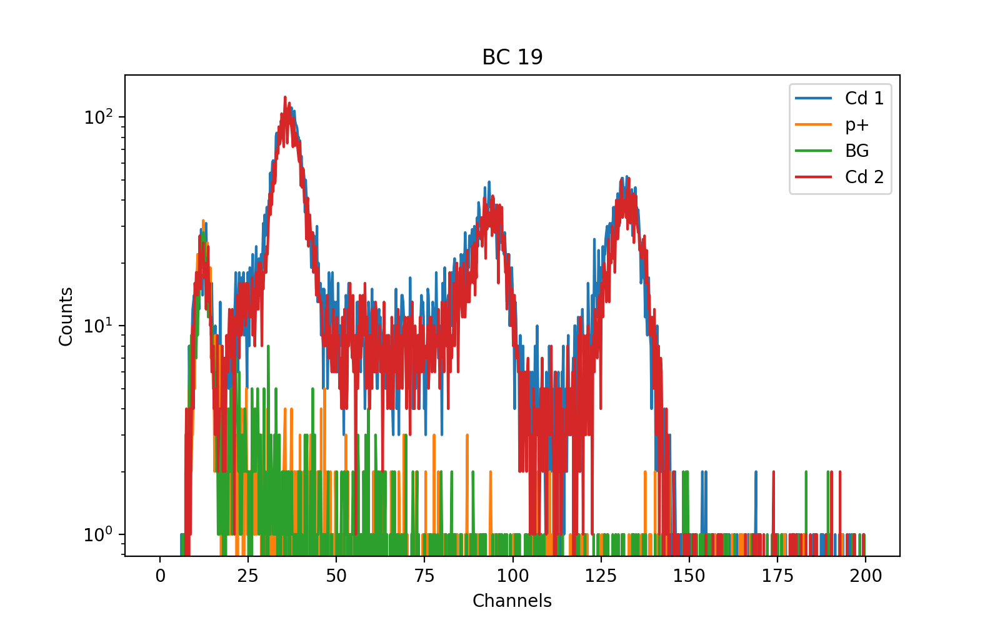

<IPython.core.display.Javascript object>


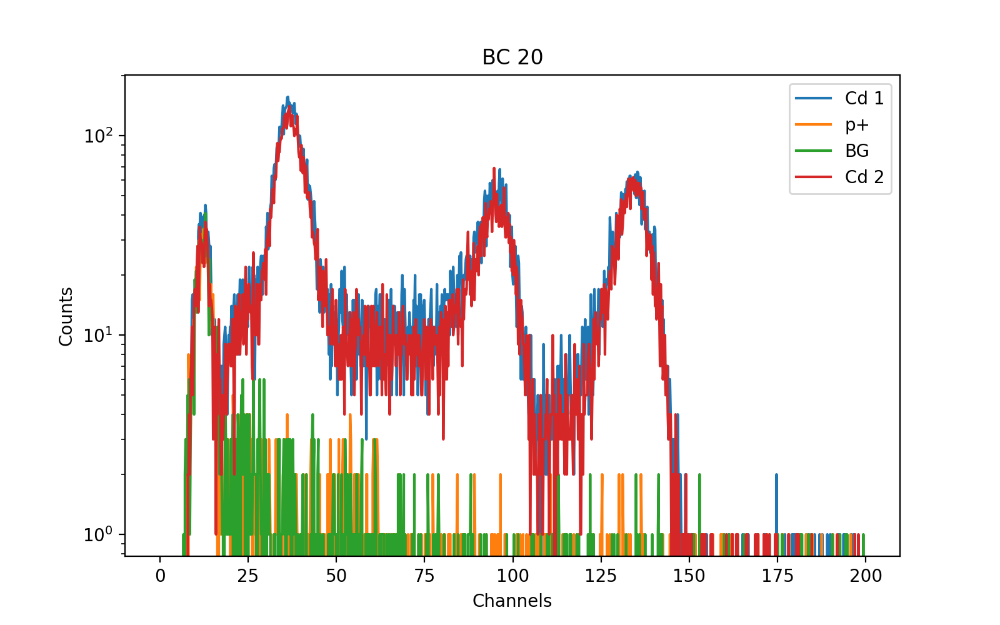

<IPython.core.display.Javascript object>


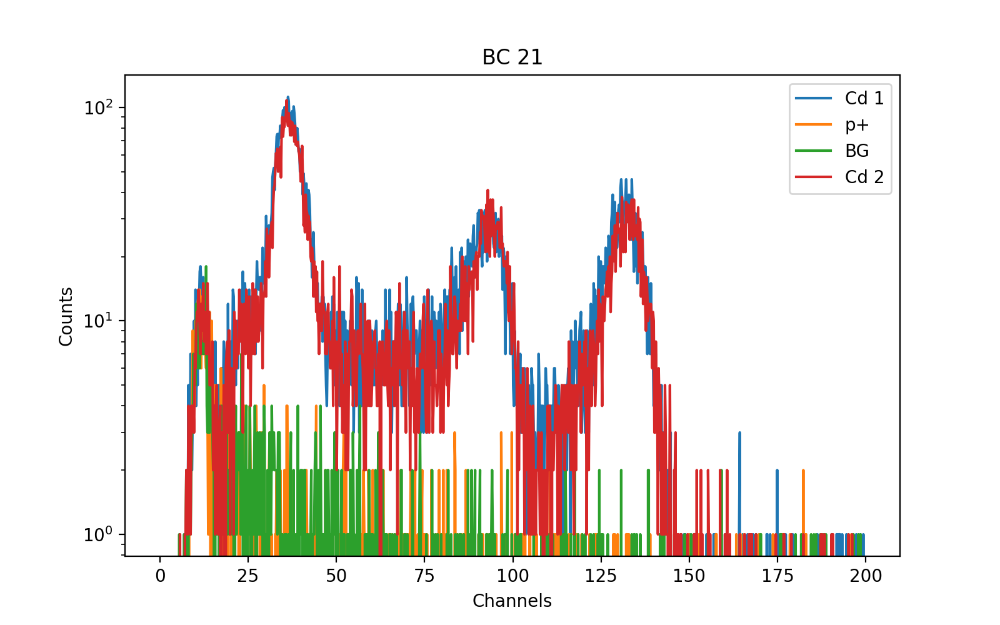

<IPython.core.display.Javascript object>


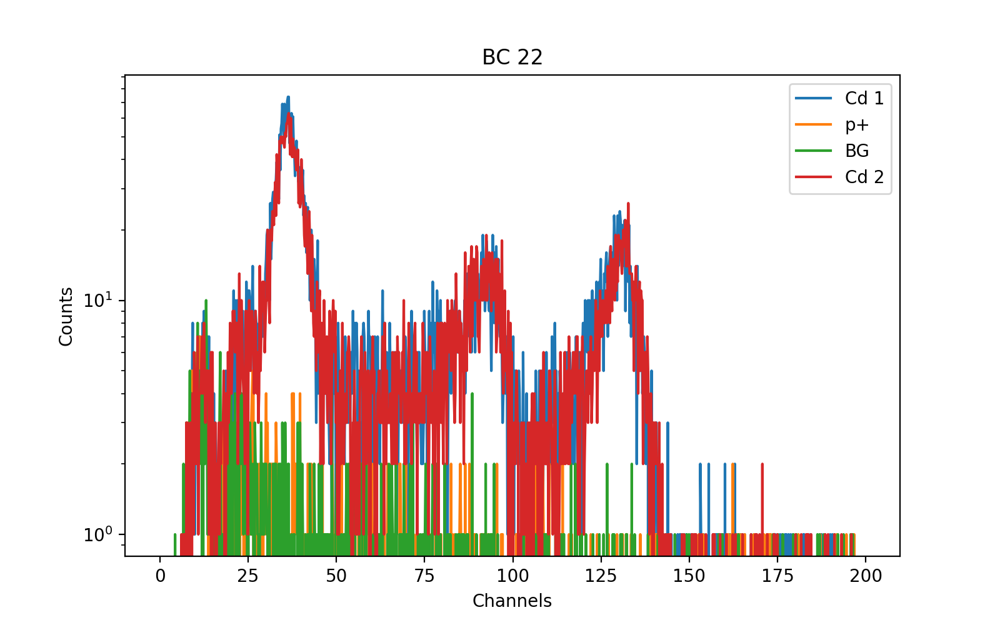

In [17]:
for bc in range(17, 23):
    plt.figure()
    plt.title("BC %d" % bc)
    plt.xlabel("Channels")
    plt.ylabel("Counts")
    for k in keys:
        pixel = pixelMapping['pixel'][pixelMapping['bc']==bc]
        hist = hitsCutDict[k][pixel-1, :][0]
        plt.plot(bins[:-1]+0.1, hist, label=k)
    plt.yscale("log")
    plt.legend(loc=0)
    plt.savefig(figDir + "%sbc_%d.png" % (figPrefix, bc))

## Pixel peak fitting

In [176]:
bcChoice = 17
key = "Cd 1"
pixel = pixelMapping['pixel'][pixelMapping['bc']==bcChoice]
histPixel = hitsCutDict[key][pixel-1, :][0]
histPixelWarm = hitsCutDict["Cd 2"][pixel-1, :][0]

175 38.193114055844774 6.557568785854821
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 175
    # variables        = 8
    chi-square         = 198.303903
    reduced chi-square = 1.18744852
    Akaike info crit   = 37.8775804
    Bayesian info crit = 63.1958682
[[Variables]]
    g_a:          133.907136 +/- 117.670538 (87.87%) (init = 104.2667)
    g_x0:         36.6861117 +/- 0.74412987 (2.03%) (init = 38.19311)
    g_sigma:      3.66343167 +/- 0.18230548 (4.98%) (init = 6.557569)
    st_x0:        36.6861117 +/- 0.74412987 (2.03%) == 'g_x0'
    st_sigma:     3.66343167 +/- 0.18230548 (4.98%) == 'g_sigma'
    st_stepSize:  1.18683666 +/- 8.71722798 (734.49%) (init = 10)
    le_x0:        36.6861117 +/- 0.74412987 (2.03%) == 'g_x0'
    le_sigma:     3.66343167 +/- 0.18230548 (4.98%) == 'g_sigma'
    le_lowexp1:   35.3646793 +/- 1920.0

<IPython.core.display.Javascript object>


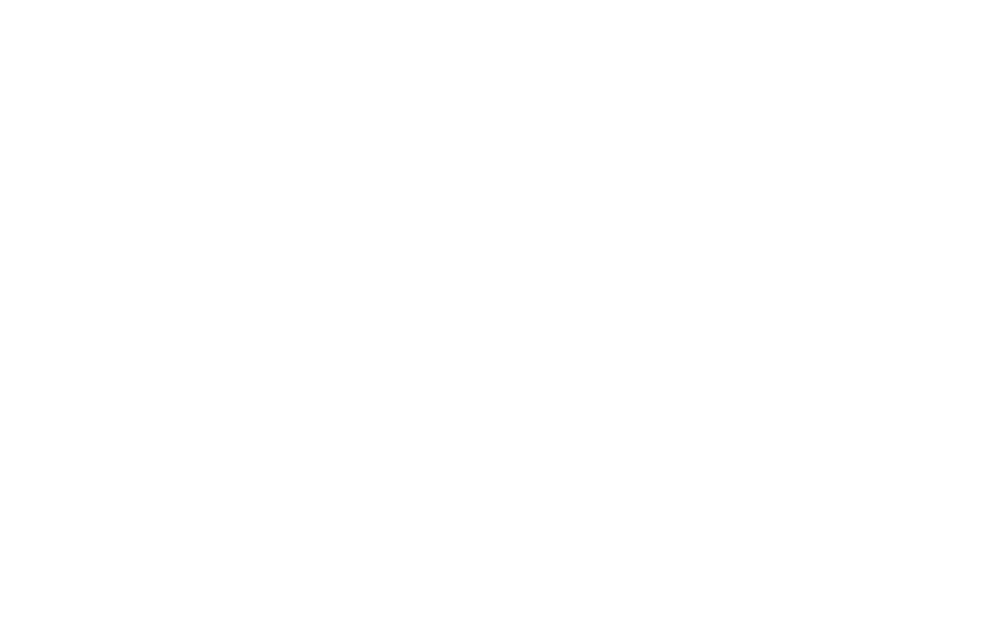

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]
185 38.23180839612489 6.8720749770892935
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 169
    # data points      = 185
    # variables        = 8
    chi-square         = 222.647835
    reduced chi-square = 1.25789737
    Akaike info crit   = 50.2685643
    Bayesian info crit = 76.0314109
[[Variables]]
    g_a:          115.395679 +/- 24.7820686 (21.48%) (init = 77.17333)
    g_x0:         36.7843471 +/- 0.46781773 (1.27%) (init = 38.23181)
    g_sigma:      3.72833505 +/- 0.17595954 (4.72%) (init = 6.872075)
    st_x0:        36.7843471 +/- 0.46781772 (1.27%) == 'g_x0'
    st_sigma:     3.72833505 +/- 0.17595954 (4.72%) == 'g_sigma'
    st_stepSize:  1.00213150 +/- 5.45056129 (543.90%) (init = 10)
    le_x0:        36.7843471 +/- 0.46781772 (1.27%) == 'g_x0'
    le_sigma:     3.72833505 +/- 0.17595954 (4.72%) == 'g_sigma'
    le_lowexp1:   1.6080e-07 +/- 414.0

<IPython.core.display.Javascript object>


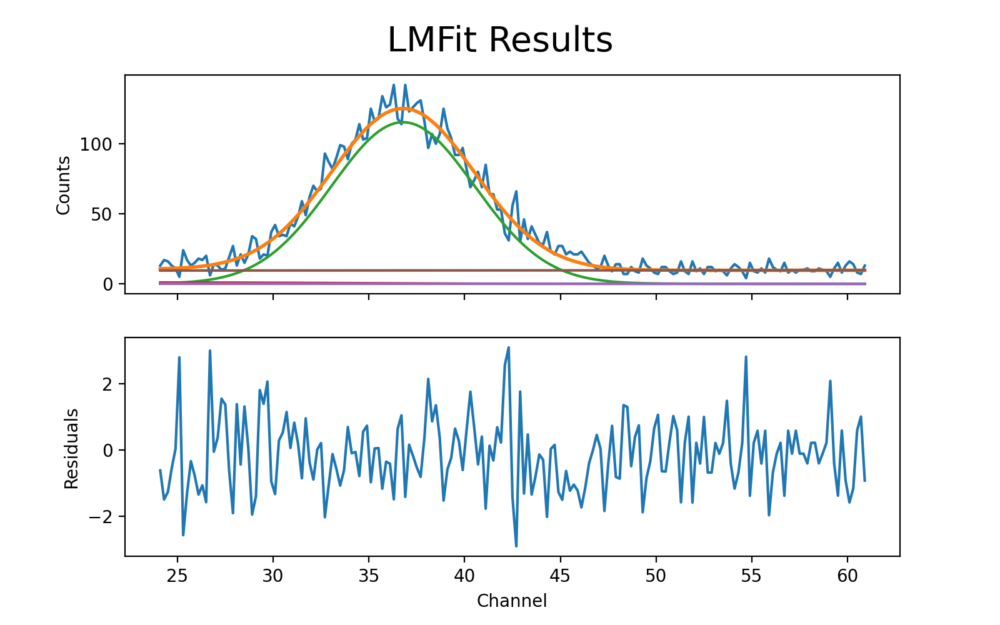

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [178]:
result22data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (25, 60))
result22dataWarm = anal.fitFunction(bins[:-1], histPixelWarm, 'Longoria', (24, 61))

200 91.2263766873795 8.47134171131857
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 298
    # data points      = 200
    # variables        = 8
    chi-square         = 215.371778
    reduced chi-square = 1.12172801
    Akaike info crit   = 30.8096732
    Bayesian info crit = 57.1962121
[[Variables]]
    g_a:          48.1909871 +/- 9.69949618 (20.13%) (init = 37.97333)
    g_x0:         95.9175743 +/- 0.77526884 (0.81%) (init = 91.22638)
    g_sigma:      3.73098807 +/- 0.27872529 (7.47%) (init = 8.471342)
    st_x0:        95.9175743 +/- 0.77526884 (0.81%) == 'g_x0'
    st_sigma:     3.73098807 +/- 0.27872529 (7.47%) == 'g_sigma'
    st_stepSize:  8.35334139 +/- 13.6348496 (163.23%) (init = 10)
    le_x0:        95.9175743 +/- 0.77526884 (0.81%) == 'g_x0'
    le_sigma:     3.73098807 +/- 0.27872529 (7.47%) == 'g_sigma'
    le_lowexp1:   94.9326196 +/- 123.0

/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:42: RuntimeWarning: overflow encountered in square
  return stepSize/(1.0+np.exp(tt))**2.0


<IPython.core.display.Javascript object>


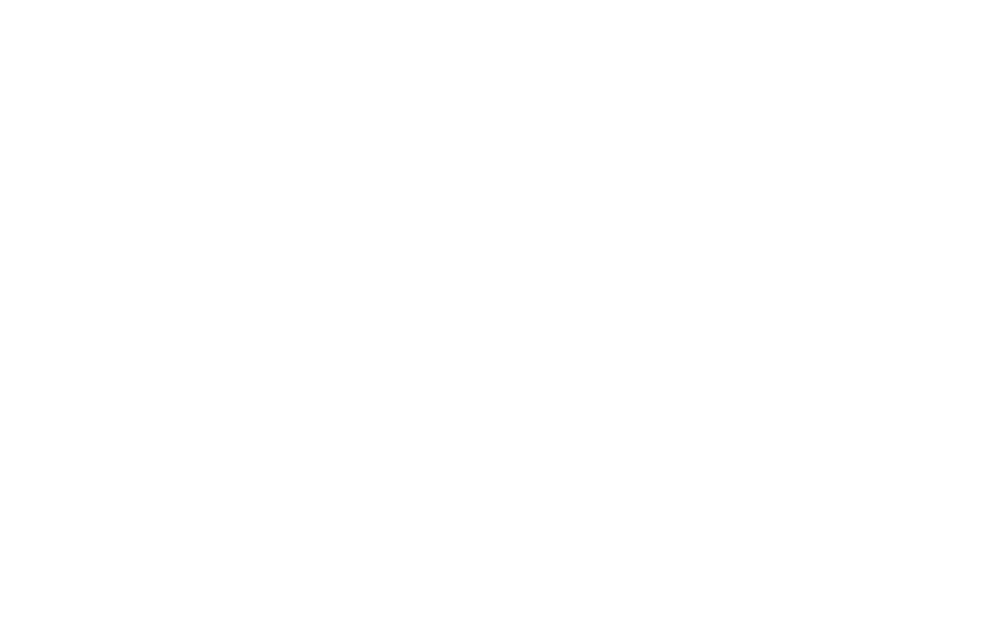

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]
195 92.70083835472886 7.504581385065262
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0
/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:42: RuntimeWarning: overflow encountered in square
  return stepSize/(1.0+np.exp(tt))**2.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 84
    # data points      = 195
    # variables        = 8
    chi-square         = 189.654623
    reduced chi-square = 1.01419584
    Akaike info crit   = 10.5799917
    Bayesian info crit = 36.7639882
[[Variables]]
    g_a:          44.2387525 +/- 5.30334802 (11.99%) (init = 26.56)
    g_x0:         95.8930799 +/- 0.54032441 (0.56%) (init = 92.70084)
    g_sigma:      3.87916964 +/- 0.28640415 (7.38%) (init = 7.504581)
    st_x0:        95.8930799 +/- 0.54032441 (0.56%) == 'g_x0'
    st_sigma:     3.87916964 +/- 0.28640415 (7.38%) == 'g_sigma'
    st_stepSize:  4.18540790 +/- 8.50240956 (203.14%) (init = 10)
    le_x0:        95.8930799 +/- 0.54032441 (0.56%) == 'g_x0'
    le_sigma:     3.87916964 +/- 0.28640415 (7.38%) == 'g_sigma'
    le_lowexp1:   65.5351159 +/- 58.650305

<IPython.core.display.Javascript object>


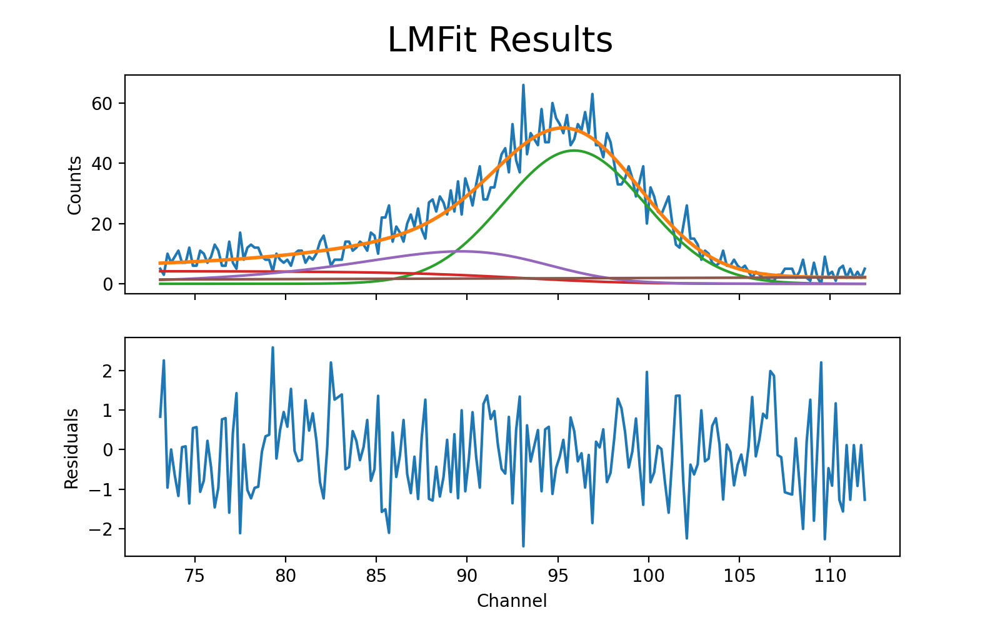

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [180]:
result62data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (70, 110))
result62dataWarm = anal.fitFunction(bins[:-1], histPixelWarm, 'Longoria', (73, 112))

205 132.38612647270986 5.872812183068622
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0
/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:42: RuntimeWarning: overflow encountered in square
  return stepSize/(1.0+np.exp(tt))**2.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 219
    # data points      = 205
    # variables        = 8
    chi-square         = 144.444576
    reduced chi-square = 0.73322120
    Akaike info crit   = -55.7733915
    Bayesian info crit = -29.1893117
[[Variables]]
    g_a:          62.0554812 +/- 5.67813477 (9.15%) (init = 64.64)
    g_x0:         134.098748 +/- 0.40801953 (0.30%) (init = 132.3861)
    g_sigma:      4.06196891 +/- 0.18403444 (4.53%) (init = 5.872812)
    st_x0:        134.098748 +/- 0.40801953 (0.30%) == 'g_x0'
    st_sigma:     4.06196891 +/- 0.18403444 (4.53%) == 'g_sigma'
    st_stepSize:  1.00000000 +/- 0.09001002 (9.00%) (init = 10)
    le_x0:        134.098748 +/- 0.40801953 (0.30%) == 'g_x0'
    le_sigma:     4.06196891 +/- 0.18403444 (4.53%) == 'g_sigma'
    le_lowexp1:   62.1131478 +/- 64.559068

<IPython.core.display.Javascript object>


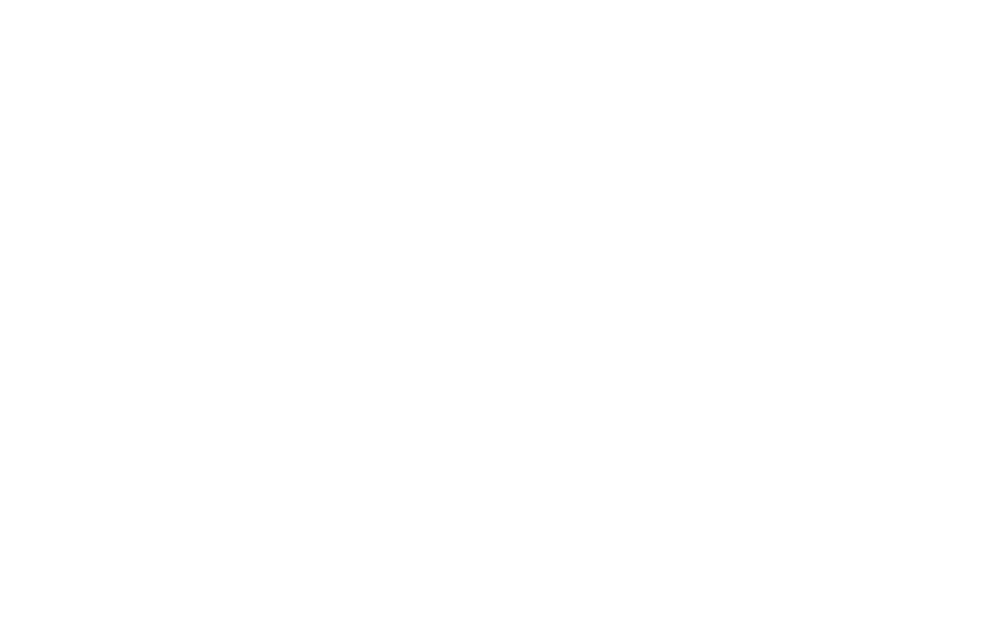

1
Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]
205 132.81652983032293 5.6953879880563045
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:42: RuntimeWarning: overflow encountered in square
  return stepSize/(1.0+np.exp(tt))**2.0
/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 89
    # data points      = 205
    # variables        = 8
    chi-square         = 200.951083
    reduced chi-square = 1.02005626
    Akaike info crit   = 11.9105635
    Bayesian info crit = 38.4946433
[[Variables]]
    g_a:          49.2412690 +/- 27.6166334 (56.08%) (init = 53.49333)
    g_x0:         134.591215 +/- 1.42554793 (1.06%) (init = 132.8165)
    g_sigma:      4.09484603 +/- 0.36053754 (8.80%) (init = 5.695388)
    st_x0:        134.591215 +/- 1.42554794 (1.06%) == 'g_x0'
    st_sigma:     4.09484603 +/- 0.36053754 (8.80%) == 'g_sigma'
    st_stepSize:  1.14184829 +/- 3.15774778 (276.55%) (init = 10)
    le_x0:        134.591215 +/- 1.42554794 (1.06%) == 'g_x0'
    le_sigma:     4.09484603 +/- 0.36053754 (8.80%) == 'g_sigma'
    le_lowexp1:   133.733331 +/- 30.760

<IPython.core.display.Javascript object>


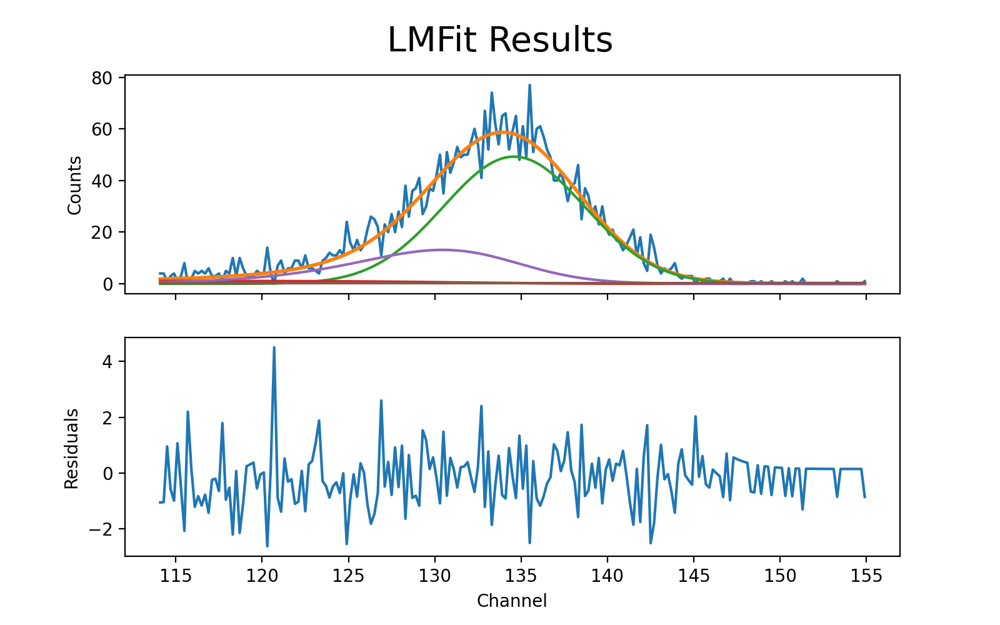

1
Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [181]:
result84data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (114, 155))
result84dataWarm = anal.fitFunction(bins[:-1], histPixelWarm, 'Longoria', (114, 155))

## Count rate

<IPython.core.display.Javascript object>


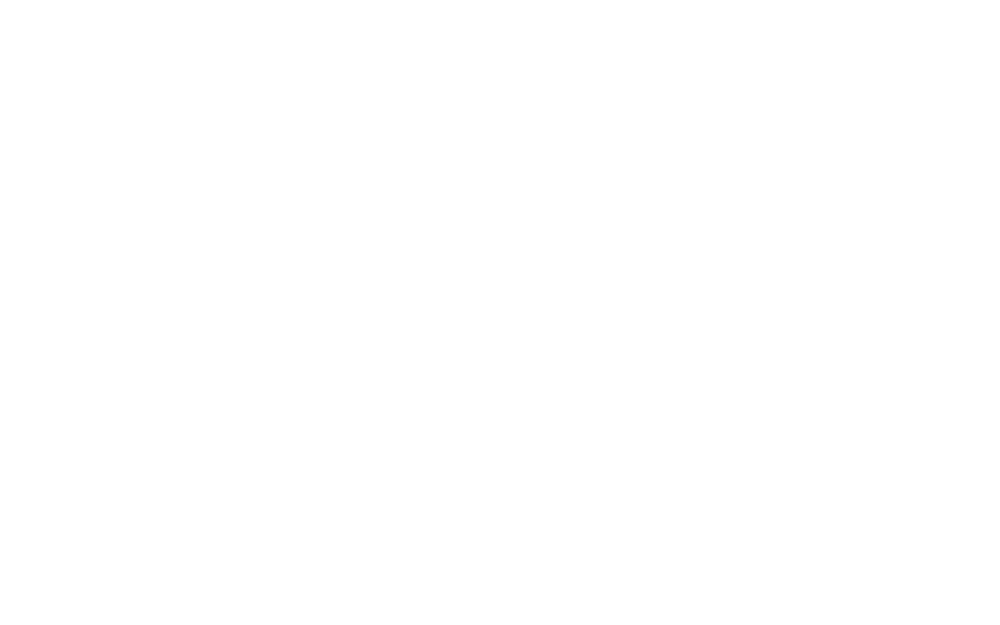

AttributeError: 'Series' object has no attribute 'compute'

In [30]:
interval = 10
plt.figure()
for k in keys:
    scopeDict[k][-1].resetCuts()
    #print(scopeDict[k][-1].data().compute()['timestamp'])
    #scopeDict[k][-1].defineCut('timestamp', 'sort')
    #scopeDict[k][-1].defineCut('t0', 'between', 3000, 4000)
    cr = calculateCountrate(scopeDict[k][-1], interval)
    plt.plot(cr, label=k)
#plt.yscale('log')
plt.legend(loc=0)
plt.xlabel("Time [%d s]" % interval)
plt.ylabel("Count rate")
plt.savefig(figDir + "%scount_rate" % figPrefix)

<IPython.core.display.Javascript object>


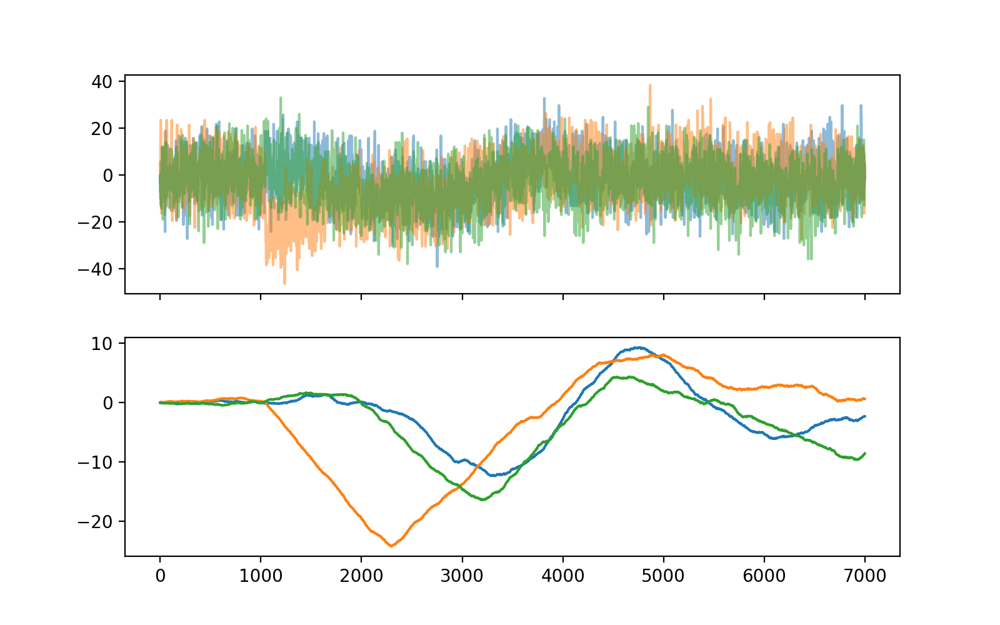

100%|██████████| 100/100 [00:01<00:00, 55.66it/s]


<IPython.core.display.Javascript object>


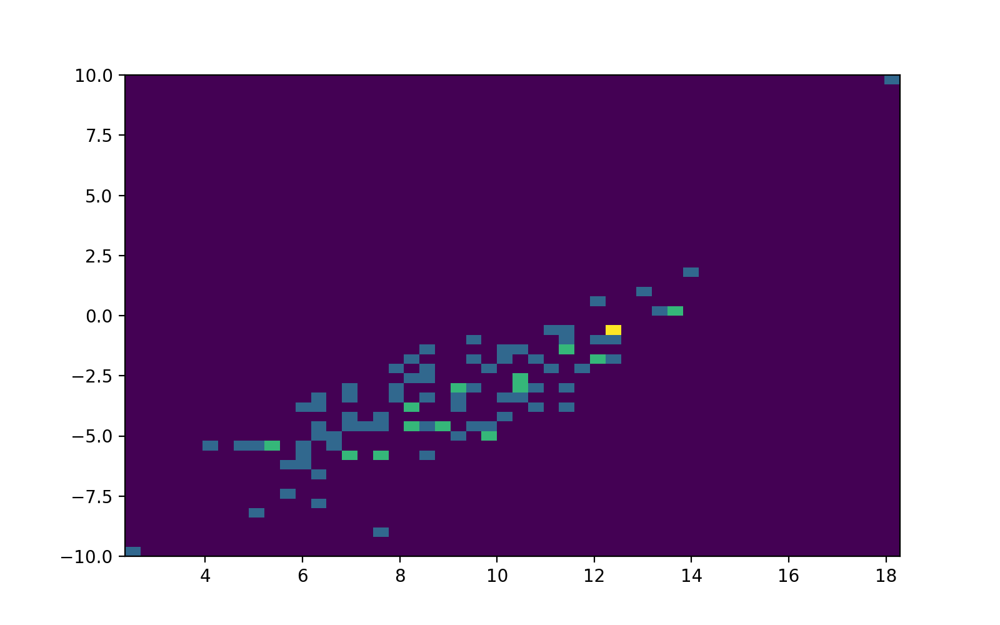

<IPython.core.display.Javascript object>


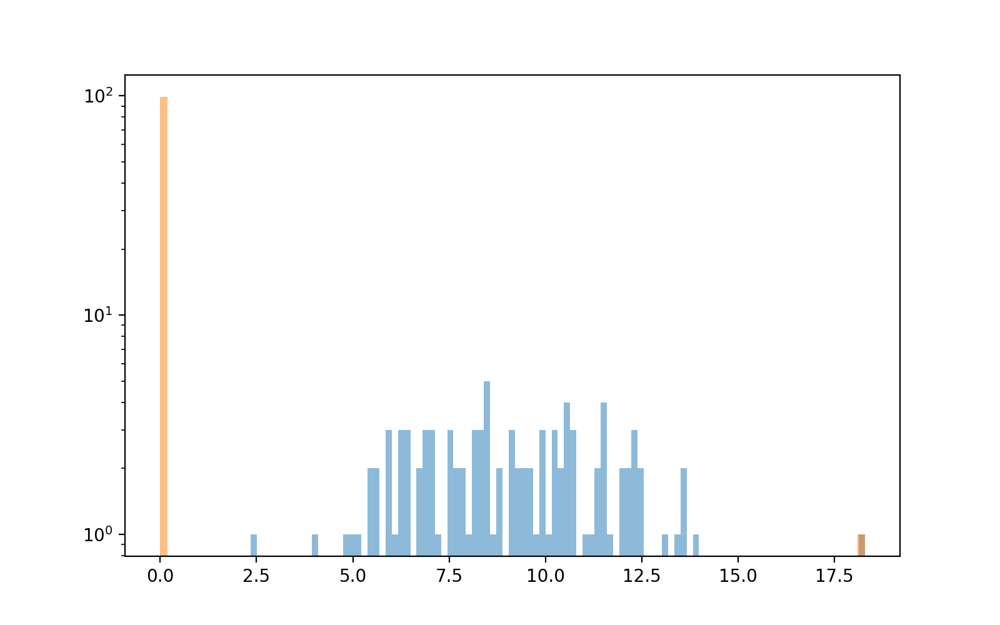

In [153]:
fig, ax = plt.subplots(2, 1, sharex=True)
filtr = bf.defineSingleTrap(1250, 40, 1250, 2540)
n = 100
eners = np.zeros(n)
filtrs = np.zeros(n)
#sps = []
#fig2, ax2 = plt.subplots(1, 1)
enersCut = np.zeros(n)
for i in tqdm(range(n)):
    wave = scopeDict["BG"][0].wave(i+80)
    wave -= np.mean(wave[:1000])
    filtered = scipy.signal.fftconvolve(wave, filtr)[:len(wave)]
    ener, t0 = bf.extractTrapResults(filtered, 1250, 40, 0.8)
    #print(ener, t0)
    #sp = np.fft.fft(wave)
    #sps.append(sp)
    if i < 3:
        ax[0].plot(wave, alpha=0.5, label="E: %.1f t0: %.1f" % (ener, t0))
        ax[1].plot(filtered)
        #ax2.plot(np.fft.fftfreq(wave.shape[-1]), sp.real, alpha=0.5)
    eners[i] = min(ener, 50)
    filtrs[i] = min(max(np.mean(filtered[1500:4700]), -10), 10)
    if filtrs[i] > 2:
        enersCut[i] = eners[i]
    
#ax[0].legend(loc=0)

plt.figure()
plt.hist2d(np.nan_to_num(eners), np.nan_to_num(filtrs), bins=50)

plt.figure()
plt.hist(eners, bins=100, alpha=0.5)
plt.hist(enersCut, bins=100, alpha=0.5)
plt.yscale("log")

<IPython.core.display.Javascript object>


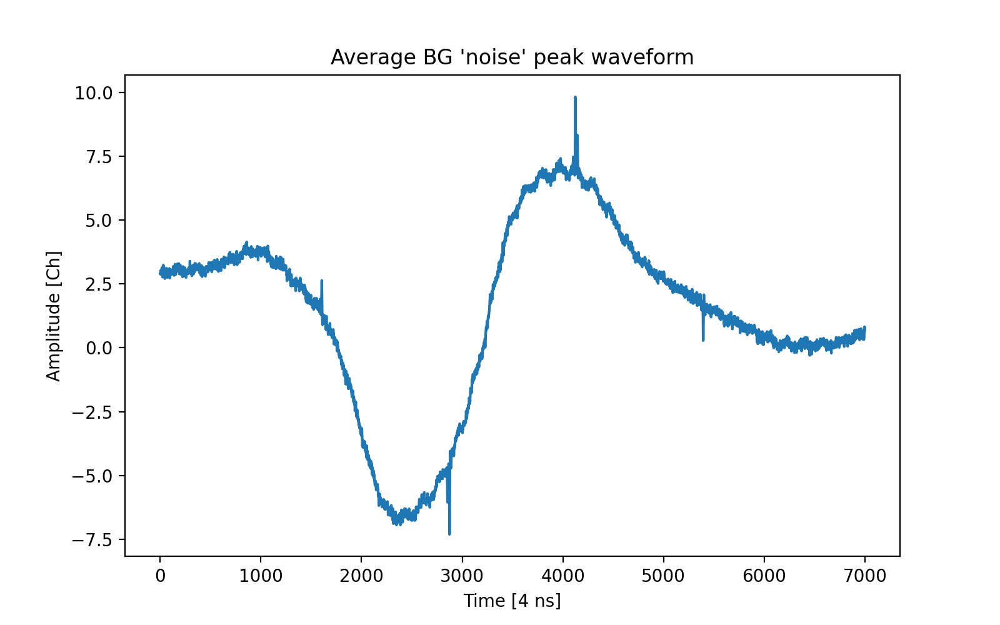

In [139]:
wfBG, timeBG, resBG = scopeDict["BG"]
resBG.resetCuts()
resBG.defineCut('bc', '=', 17)
resBG.defineCut('energy', 'between', 5, 19)
cut = resBG.returnCut()
wfBG.defineCut('custom', cut)
avgWF = wfBG.averageWaveforms(correctBaseline=True)
plt.figure()
plt.plot(avgWF)
plt.xlabel("Time [4 ns]")
plt.ylabel("Amplitude [Ch]")
plt.title("Average BG 'noise' peak waveform")
plt.savefig(figDir + figPrefix + "average_bg_wf")

# Simulated data

In [2]:
from basic_G4_analysis import *
import uproot
import scipy.linalg as la

In [32]:
figDirSim = "/Users/leenderthayen/git/NDP/analysis/figures/G4/"
figPrefixSim = "109Cd_1_4"

fileDirSim = "/Users/leenderthayen/git/NDP/data/G4/"

fileNameSim = "109Cd_front_UoM_1+4.0_new.root"

In [33]:
fileSim = uproot.open(fileDirSim + fileNameSim)

1it [00:00,  2.37it/s]


<IPython.core.display.Javascript object>


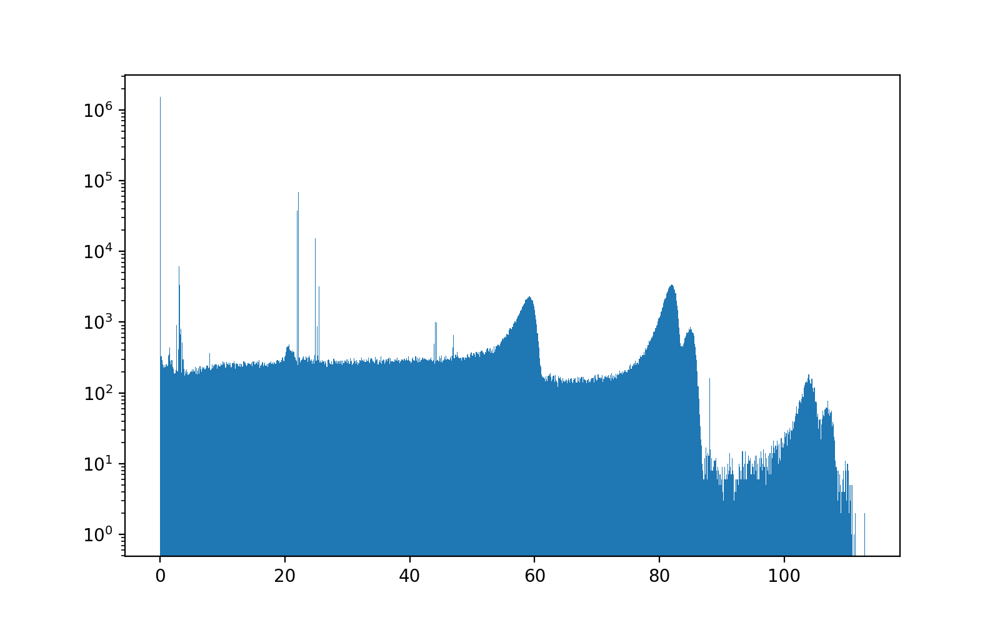

In [199]:
makeHist(fileSim["ntuple/energy"], "enSi")

binWidthSim = 0.1

binsSim = np.arange(0, 100, binWidthSim)

## Charge collection efficiency

In [36]:
dl = 1e-4 # 100 nm, in mm

cceHard = lambda z: np.where(z < dl, 0, 1)
cceSoft = lambda z: 1-np.exp(-z/dl/1.15)

## Spectral analysis

<IPython.core.display.Javascript object>


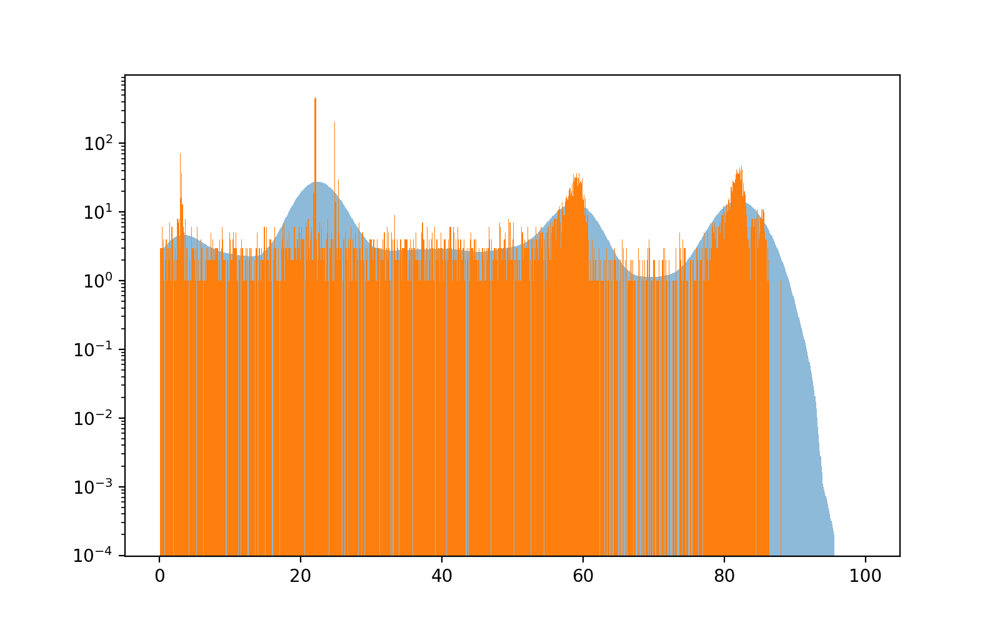

In [42]:
histSim, _ = buildPixelSpectrum(fileSim["ntuple/hits"], 76, cce=cceHard, bins=binsSim, plot=False)
res = convolveHist(histSim[1:], binsSim[1:], 2.5)

180 22.15701780285626 3.3817671483702214
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...
[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 115
    # data points      = 180
    # variables        = 8
    chi-square         = 0.74237758
    reduced chi-square = 0.00431615
    Akaike info crit   = -972.353747
    Bayesian info crit = -946.810092
[[Variables]]
    g_a:          25.1514761 +/- 1.66544616 (6.62%) (init = 18.94628)
    g_x0:         22.3813407 +/- 0.05847679 (0.26%) (init = 22.15702)
    g_sigma:      2.69966792 +/- 0.03234412 (1.20%) (init = 3.381767)
    st_x0:        22.3813407 +/- 0.05847679 (0.26%) == 'g_x0'
    st_sigma:     2.69966792 +/- 0.03234412 (1.20%) 

<IPython.core.display.Javascript object>


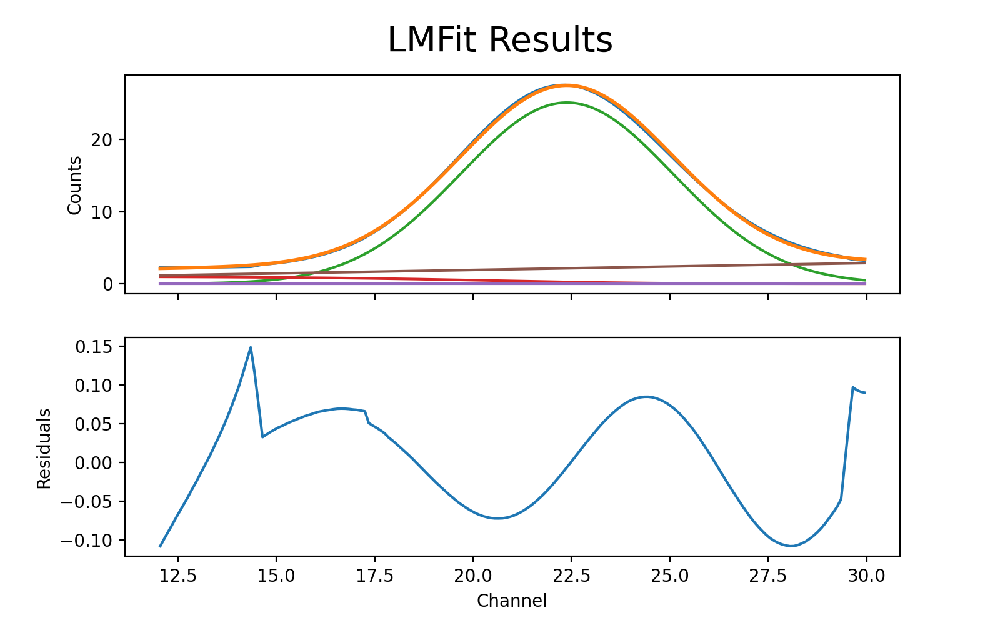

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [43]:
results22 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (12, 30))

170 58.1024720139972 3.5557441408075996
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 170
    # variables        = 8
    chi-square         = 0.00524767
    reduced chi-square = 3.2393e-05
    Akaike info crit   = -1749.58092
    Bayesian info crit = -1724.49454
[[Variables]]
    g_a:          10.1833434 +/- 0.40061259 (3.93%) (init = 9.381534)
    g_x0:         59.0217635 +/- 0.05349215 (0.09%) (init = 58.10247)
    g_sigma:      2.68205060 +/- 0.00656946 (0.24%) (init = 3.555744)
    st_x0:        59.0217635 +/- 0.05349215 (0.09%) == 'g_x0'
    st_sigma:     2.68205060 +/- 0.00656946 (0.24%) == 'g_sigma'
    st_stepSize:  1.47931915 +/- 0.19459365 (13.15%) (init = 5.863458)
    le_x0:        59.0217635 +/- 0.05349215 (0.09%) == 'g_x0'
    le_sigma:     2.68205060 +/- 0.00656946 (0.24%) == 'g_sigma'
    le_lowexp1:   23.4523416 +/- 

<IPython.core.display.Javascript object>


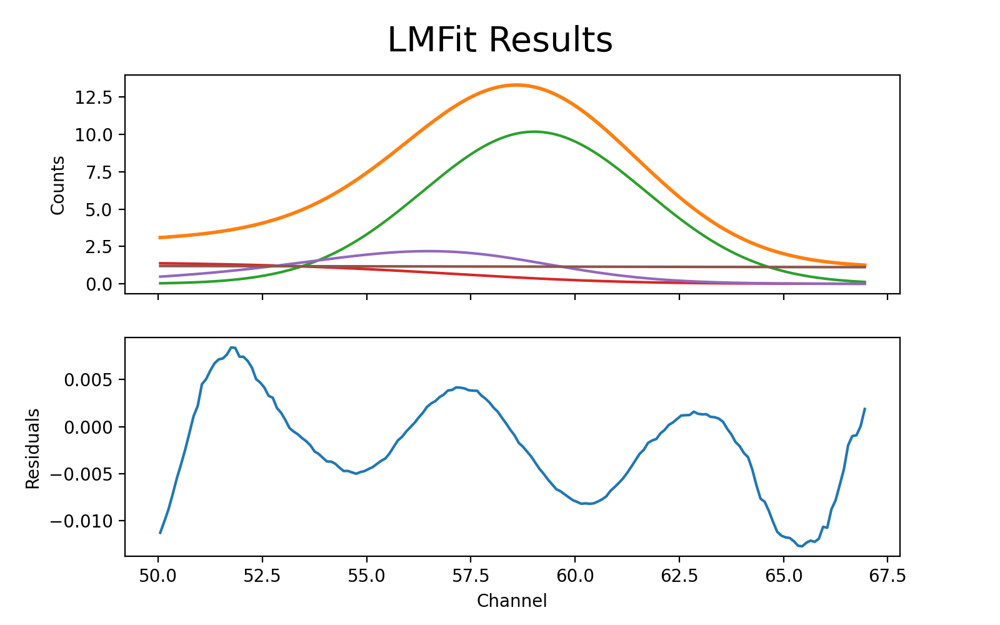

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [44]:
results62 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (50, 67))

220 81.65367857817881 3.2565125637891383
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 194
    # data points      = 220
    # variables        = 8
    chi-square         = 0.20611044
    reduced chi-square = 9.7222e-04
    Akaike info crit   = -1518.05356
    Bayesian info crit = -1490.90454
[[Variables]]
    g_a:          13.3420736 +/- 0.72383926 (5.43%) (init = 11.72759)
    g_x0:         82.0881922 +/- 0.05311786 (0.06%) (init = 81.65368)
    g_sigma:      3.00930188 +/- 0.01160038 (0.39%) (init = 3.256513)
    st_x0:        82.0881922 +/- 0.05311786 (0.06%) == 'g_x0'
    st_sigma:     3.00930188 +/- 0.01160038 (0.39%) == 'g_sigma'
    st_stepSize:  1.18023931 +/- 0.05671658 (4.81%) (init = 7.329746)
    le_x0:        82.0881922 +/- 0.05311786 (0.06%) == 'g_x0'
    le_sigma:     3.00930188 +/- 0.01160038 (0.39%) == 'g_sigma'
    le_lowexp1:   14.4744545 +/- 

<IPython.core.display.Javascript object>


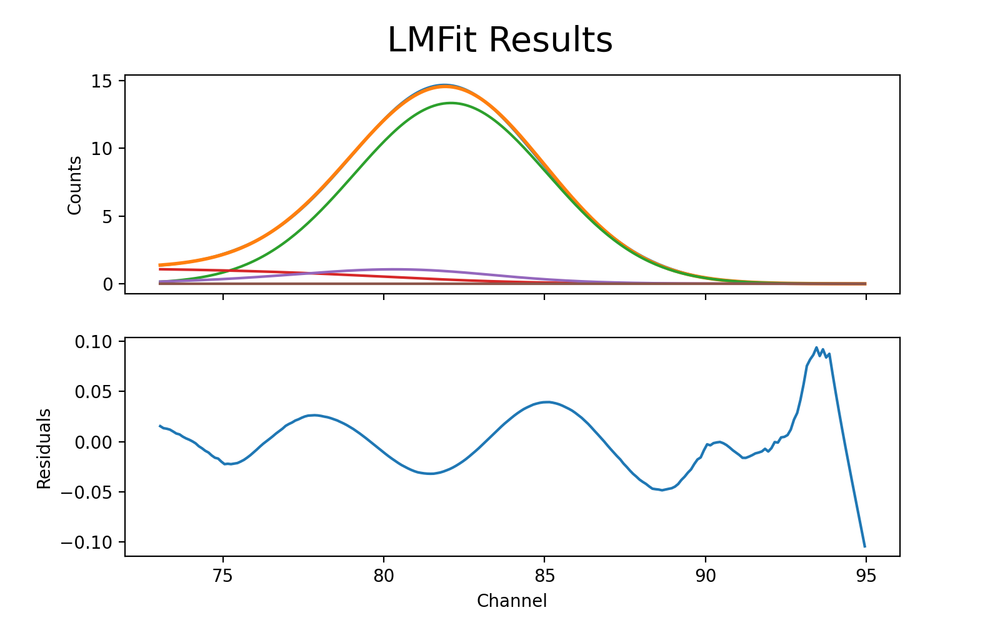

2
The relative error between two consecutive iterates is at most 0.000000
Fit succeeded.
[<Figure size 800x500 with 2 Axes>]


In [45]:
results85 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (73, 95))

# Calibration

In [182]:
centroidData = np.array([x[1].params["g_x0"].value for x in (result22data, result62data, result84data)])
centroidDataWarm = np.array([x[1].params["g_x0"].value for x in (result22dataWarm, result62dataWarm, result84dataWarm)])
centroidSim = np.array([x[1].params["g_x0"].value for x in (results22, results62, results85)])
stderrData = np.array([x[1].params["g_x0"].stderr for x in (result22data, result62data, result84data)])
stderrDataWarm = np.array([x[1].params["g_x0"].stderr for x in (result22dataWarm, result62dataWarm, result84dataWarm)])
stderrSim = np.array([x[1].params["g_x0"].stderr for x in (results22, results62, results85)])

In [183]:
polyres, polycov = np.polyfit(centroidData, centroidSim, 1, w=1./stderrData, cov=True)
fit = np.poly1d(polyres)
fiterr = np.sqrt(np.diag(polycov))
polyresW, polycovW = np.polyfit(centroidDataWarm, centroidSim, 1, w=1./stderrDataWarm, cov=True)
fitW = np.poly1d(polyresW)
fiterrW = np.sqrt(np.diag(polycovW))

Based on the correlation matrix, the slope and offset are essentially completely anti-correlated

<IPython.core.display.Javascript object>


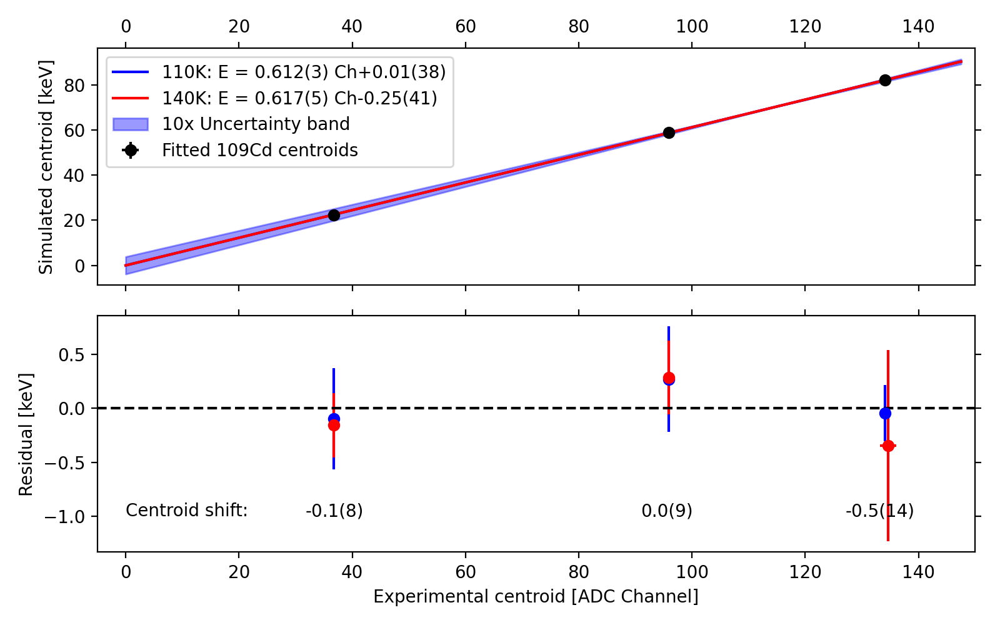

In [198]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].errorbar(centroidData, centroidSim, yerr=stderrData, xerr=stderrSim, fmt="ko", label="Fitted 109Cd centroids")
x = np.linspace(0, 1.1*max(centroidData), 100)
ax[0].plot(x, fit(x), 'b-', label="110K: E = %.3f(%d) Ch%+.2f(%d)" % (polyres[0], fiterr[0]*1e3, polyres[1], fiterr[1]*1e2))
ax[0].plot(x, fit(x), 'r-', label="140K: E = %.3f(%d) Ch%+.2f(%d)" % (polyresW[0], fiterrW[0]*1e3, polyresW[1], fiterrW[1]*1e2))
ax[1].errorbar(centroidData, centroidSim-fit(centroidData), yerr=fit(stderrData), fmt="bo", xerr=stderrData)
ax[1].errorbar(centroidDataWarm, centroidSim-fit(centroidDataWarm), yerr=fit(stderrDataWarm), fmt="ro", xerr=stderrDataWarm)
ax[0].fill_between(x, np.poly1d(polyres+[10*fiterr[0], -10*fiterr[1]])(x), np.poly1d(polyres+[-10*fiterr[0], 10*fiterr[1]])(x), color="b", alpha=0.4, label="10x Uncertainty band")
ax[1].hlines(0, -10, 170, color="k", ls="--")
ax[0].legend(loc=0)
ax[1].set_xlim((-5, 150))
ax[0].tick_params(labelbottom=False, labeltop=True, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)
ax[1].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)

ax[0].set_ylabel("Simulated centroid [keV]")
ax[1].set_ylabel("Residual [keV]")
ax[1].set_xlabel("Experimental centroid [ADC Channel]")

ax[1].text(centroidData[0]-5, -1, "%.1f(%d)" % (centroidData[0]-centroidDataWarm[0], 10*np.sqrt(stderrData[0]**2+stderrDataWarm[0]**2)))
ax[1].text(centroidData[1]-5, -1, "%.1f(%d)" % (centroidData[1]-centroidDataWarm[1], 10*np.sqrt(stderrData[1]**2+stderrDataWarm[1]**2)))
ax[1].text(centroidData[2]-7, -1, "%.1f(%d)" % (centroidData[2]-centroidDataWarm[2], 10*np.sqrt(stderrData[2]**2+stderrDataWarm[2]**2)))
ax[1].text(0, -1, "Centroid shift:")
fig.tight_layout()
fig.savefig(figDirSim + figPrefixSim + "px76_109Cd_calibration_cold_warm.pdf")

<IPython.core.display.Javascript object>


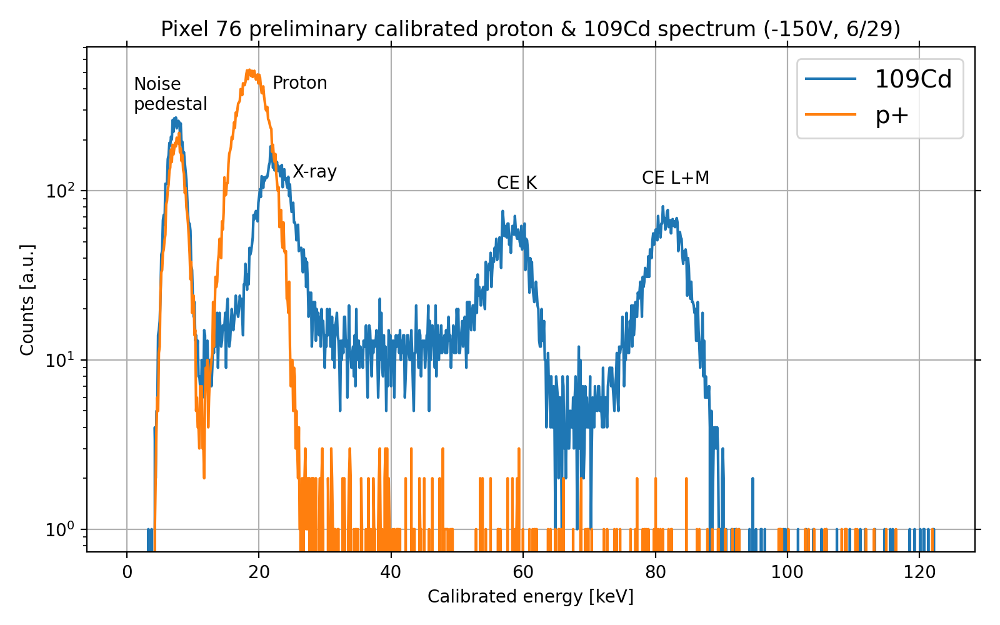

In [170]:
histPixelCd = hitsCutDict["Cd 1"][pixel-1, :][0]
histPixelp = hitsCutDict["p+"][pixel-1, :][0]
plt.figure()
plt.plot(fit(bins[:-1]+0.1), histPixelCd, label="109Cd")
plt.plot(fit(bins[:-1]+0.1), histPixelp, label="p+")
plt.yscale("log")
plt.xlabel("Calibrated energy [keV]")
plt.ylabel("Counts [a.u.]")
plt.legend(loc=0, fontsize=14)
plt.grid()
plt.text(1, 300, "Noise\npedestal")
plt.text(22, 400, "Proton")
plt.text(25, 120, "X-ray")
plt.text(56, 103, "CE K")
plt.text(78, 110, "CE L+M")
plt.tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)
plt.title("Pixel 76 preliminary calibrated proton & 109Cd spectrum (-150V, 6/29)")
plt.tight_layout()
plt.savefig(figDirSim + figPrefixSim + "px76_calibrated_proton_109Cd.pdf")

In [3]:
plt.figure()
plt.plot(bins[:-1]+0.1, histPixelCd, label="Experimental 109Cd")
l = "Proposed peak fits\nP1 chi2/v: %.1f\nP2 chi2/v: %.1f\nP3 chi2/v: %.1f" % (result22data[1].redchi, result62data[1].redchi, result84data[1].redchi)
plt.plot(np.linspace(25, 60, result22data[1].ndata), result22data[1].best_fit, "r-", lw=3, label=l)
plt.plot(np.linspace(70, 110, result62data[1].ndata), result62data[1].best_fit, "r-", lw=3)
plt.plot(np.linspace(114, 155, result84data[1].ndata), result84data[1].best_fit, "r-", lw=3)
plt.legend(loc=0)
plt.yscale("log")
plt.xlabel("ADC Channel")
plt.ylabel("Counts [a.u.]")
plt.title("Preliminary pixel 76 peak fitting for 109Cd decay (-150V, 6/29)")
plt.text(-5, 5, "Noise\npedestal")
plt.text(30, 200, "X-ray")
plt.text(85, 103, "CE K")
plt.text(120, 110, "CE L+M")
plt.tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)
plt.tight_layout()
plt.savefig(figDirSim + figPrefixSim + "px76_peak_fits_109Cd.png")

NameError: name 'bins' is not defined